In [1]:
from google.colab import drive
drive.mount('/content/drive', force_remount=True)

Mounted at /content/drive


In [2]:
!ls drive/MyDrive/Bathy/Survey_Data/

Bakreshwar   Getalsud_full  Kandala_creek      Kolkata			 Rihand_Dam
Dhurwa_full  Hirakud	    Kandla_creek       Kolkata_port_sea_channel  Sholayar
Dibang_Dam   Hirakud_dam    Khadakwasala       Mahi_Bajaj_Sagar_Dam	 Tenughat
Getalsud     Kadana_dam     Khamaria_Jabalpur  Rihand			 Tenughat_full


In [3]:
!ls drive/MyDrive/Bathy/Survey_Data/Khadakwasala/
#!ls drive/MyDrive/Bathy/Survey_Data/Dhurwa_full/DHURWA_DAM_1M_MSL_DEPTH_1_2022.xyz

20230823_105055_S.xyz  20230823_113129_S.xyz  20230823_115540_S.xyz  figure.png
20230823_111608_S.xyz  20230823_113815_S.xyz  20230823_122954_S.xyz


In [4]:
import pandas as pd
df = pd.read_csv('drive/MyDrive/Bathy/Survey_Data/Khadakwasala/20230823_105055_S.xyz', header=None).iloc[6:10]
df.head()

,0
6,367993.29 2039020.60 2.30
7,367993.29 2039020.60 2.30
8,367993.29 2039020.60 2.30
9,367993.29 2039020.60 2.30


In [5]:
# import pandas as pd
# df = pd.read_csv('drive/MyDrive/Bathy/Survey_Data/Kolkata_port_sea_channel/Eastern_Channe_January_2020.xyz', header=None)
# df = pd.concat([df, pd.read_csv('drive/MyDrive/Bathy/Survey_Data/Kolkata_port_sea_channel/Western_Channel_Dec_2019.XYZ', header=None)]).sort_index()
# df

In [6]:
# df = pd.read_csv('drive/MyDrive/Bathy/Survey_Data/Dhurwa_full/DHURWA_DAM_1M_MSL_DEPTH_1_2022.xyz', header=None)
# df

In [7]:
#!ls drive/MyDrive/Bathy/Survey_Data/Rihand

In [8]:
ip_path = '/content/drive/MyDrive/Dam_data/'
dams = ['Tenughat', 'Getalsud', 'Mahi river', 'Kadana', 'Bakreshwar', 'Rihand']
start_dates = ['2021-09-02', '2021-09-02', '2019-12-17', '2020-10-28', '2022-03-02', '2021-10-20']
end_dates = ['2021-09-20', '2021-09-27', '2020-01-31', '2021-01-03', '2022-09-20', '2021-10-30']

In [9]:
# INSTALLING REQUIRED LIBRARIES
!pip install -U pyproj -q
!pip install -U utm -q

  Preparing metadata (setup.py) ... done


In [10]:
!pip install -U google-colab -q
!pip install -U tornado -q
!pip install geemap -q

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 28.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 437.2/437.2 kB 8.4 MB/s eta 0:00:00
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
google-colab 1.0.0 requires tornado==6.3.3, but you have tornado 6.4.2 which is incompatible.


In [11]:
!pip install wxee

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 22.2/22.2 MB 92.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 61.9/61.9 kB 6.1 MB/s eta 0:00:00


In [12]:
!pip install plotly --upgrade

In [13]:
!pip install -U kaleido

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.9/79.9 MB 25.7 MB/s eta 0:00:00


In [14]:
# !earthengine authenticate
import ee
import os

# Set the path to the service account key file
service_account = 'editor@ee-manmeet20singh15-wbis.iam.gserviceaccount.com'
key_file = 'drive/MyDrive/earth_engine/ee-manmeet20singh15-wbis-fab7f1ca35e0.json'

# Use the service account for authentication
credentials = ee.ServiceAccountCredentials(service_account, key_file)
ee.Initialize(credentials)

In [15]:
import ee
import wxee
# wxee.Initialize()

In [16]:
from geopy.geocoders import Nominatim
from pyproj import CRS
import utm
#import proj
import pandas as pd
import numpy as np
import plotly.io as pio

In [17]:
def get_epsg(dam_name, country):
  geolocator = Nominatim(user_agent='my_user_agent')
  # get location in lat lon
  loc = geolocator.geocode(dam_name  + ',' + country)
  # get utm zone and utm letter from lat lon
  x, y, utm_zone, letter = utm.from_latlon(loc.latitude, loc.longitude)
  # predefined utm letters
  # https://www.maptools.com/tutorials/grid_zone_details#:~:text=Each%20zone%20is%20divided%20into,spans%2012%C2%B0%20of%20latitude.
  nothern_letters = ('N','P','Q','R','S','T','U','V','W','X')
  southern_letters = ('M','L','K','J','H','G','F','E','D','C')
  # check hemisphere using utm letter
  if letter in nothern_letters:
    hemisphere = 'nothern'
    north_south = True
  else:
    hemisphere = 'southern'
    north_south = False
  # get crs info using utm zone and hemisphere
  crs = CRS.from_dict({'proj': 'utm', 'zone': utm_zone, north_south: True})
  # formatting epsg code into required fromat
  epsg = crs.to_authority()[0] + ':' + crs.to_authority()[1]
  return epsg, hemisphere, north_south

In [18]:
# dam = dams[0]
# i_dam = 0

# #epsg, hemisphere, north_south = get_epsg(dam_name=dam, country='India')
# start_date, end_date = start_dates[i_dam], end_dates[i_dam]

In [19]:
from pathlib import Path

directory = Path('drive/MyDrive/Bathy/Survey_Data/Khadakwasala/')
path = 'drive/MyDrive/Bathy/Survey_Data/Khadakwasala/'
df = pd.DataFrame()
for file in directory.glob('*.xyz'):
    print(file.name)
    df = pd.concat([df, pd.read_csv(path+file.name, header=None).iloc[6:]]).sort_index()
df

20230823_105055_S.xyz
20230823_111608_S.xyz
20230823_113129_S.xyz
20230823_113815_S.xyz
20230823_115540_S.xyz
20230823_122954_S.xyz


,0
6,367993.29 2039020.60 2.30
6,368651.84 2038757.26 9.49
6,367982.33 2039014.76 1.60
6,367997.24 2038958.20 5.36
6,369446.35 2038298.59 6.11
...,...
17168,367989.96 2039008.80 1.99
17169,367989.97 2039008.81 1.99
17170,367989.97 2039008.81 1.99
17171,367989.97 2039008.81 1.99


In [20]:
#print(get_epsg(dam_name='Tenughat', country='India'))

In [21]:
#epsg, hemisphere, north_south = '32645', 'northern', True
#https://epsg.io/32644

In [22]:
epsg, hemisphere, north_south = get_epsg(dam_name='Khadakwasla', country='India')

In [23]:
zone = int(epsg[-2:])

In [24]:
zone

43

In [25]:
df

,0
6,367993.29 2039020.60 2.30
6,368651.84 2038757.26 9.49
6,367982.33 2039014.76 1.60
6,367997.24 2038958.20 5.36
6,369446.35 2038298.59 6.11
...,...
17168,367989.96 2039008.80 1.99
17169,367989.97 2039008.81 1.99
17170,367989.97 2039008.81 1.99
17171,367989.97 2039008.81 1.99


In [26]:
from tqdm import tqdm

df_ = df.copy()
df_[[0, 1, 2]] = df_[0].str.split(' ', expand=True)
print(pd.isnull(df_.iloc[0,2]))
for i in tqdm(range(df_.shape[0])):
    #print(pd.isnull(df_.iloc[i,2]))
    if len(df_.iloc[i,2])==0:
        df_.iloc[i,2] = df_.iloc[i,3]
df_

False


100%|██████████| 42552/42552 [00:00<00:00, 52624.74it/s]


,0,1,2
6,367993.29,2039020.60,2.30
6,368651.84,2038757.26,9.49
6,367982.33,2039014.76,1.60
6,367997.24,2038958.20,5.36
6,369446.35,2038298.59,6.11
...,...,...,...
17168,367989.96,2039008.80,1.99
17169,367989.97,2039008.81,1.99
17170,367989.97,2039008.81,1.99
17171,367989.97,2039008.81,1.99


In [27]:
# df_.drop(df_.columns[3], axis=1, inplace=True)
# df_

In [28]:
df = df_.copy()
df = df.apply(pd.to_numeric, errors='coerce')
df.iloc[0,2]

2.3

In [29]:
x_coord = df.values[:,0]
y_coord = df.values[:,1]

In [30]:
latitude, longitude = utm.to_latlon(x_coord, y_coord, zone, northern=north_south)

In [31]:
df['lat'] = latitude
df['lon'] = longitude

In [32]:
df['bathy'] = df.iloc[:,2] #np.max(df.iloc[:,2].values) - df.iloc[:,2].values

In [33]:
df_survey = df.copy()
df_survey

,0,1,2,lat,lon,bathy
6,367993.29,2039020.60,2.30,18.437276,73.750000,2.30
6,368651.84,2038757.26,9.49,18.434937,73.756252,9.49
6,367982.33,2039014.76,1.60,18.437222,73.749897,1.60
6,367997.24,2038958.20,5.36,18.436712,73.750042,5.36
6,369446.35,2038298.59,6.11,18.430842,73.763804,6.11
...,...,...,...,...,...,...
17168,367989.96,2039008.80,1.99,18.437169,73.749969,1.99
17169,367989.97,2039008.81,1.99,18.437169,73.749969,1.99
17170,367989.97,2039008.81,1.99,18.437169,73.749969,1.99
17171,367989.97,2039008.81,1.99,18.437169,73.749969,1.99


In [34]:
print(np.min(df.lat.values), np.max(df.lat.values))
print(np.min(df.lon.values), np.max(df.lon.values))
print((np.max(df.lat.values) - np.min(df.lat.values))/0.0006)
print((np.max(df.lon.values) - np.min(df.lon.values))/0.0006)
print(np.max(df.bathy.values))

18.43012172537667 18.439889109551306
73.74970441821611 73.77112088194058
16.27897362439512
35.69410620743933
15.99


In [35]:
import plotly.express as px
# df = px.data.carshare()
fig = px.scatter_mapbox(df_survey, lat="lat", lon="lon", color="bathy",
                  color_continuous_scale=px.colors.cyclical.IceFire, size_max=5, zoom=12,
                  mapbox_style="carto-positron")
pio.write_image(fig, 'figure.png', scale=5)
fig.show()

In [36]:
!ls
!mv figure.png drive/MyDrive/Bathy/Survey_Data/Khadakwasala//

drive  figure.png  sample_data


In [37]:
# import plotly.express as px
# fig = px.scatter_mapbox(df, lat="lat", lon="lon", color="bathy",
#                   color_continuous_scale=px.colors.cyclical.IceFire, size_max=5, zoom=12,
#                   mapbox_style="carto-positron")
# #pio.write_image(fig, 'test.png')
# fig.write_image("test.png", engine="kaleido")

In [38]:
from scipy import stats

In [39]:
lon_diff = (np.max(df.lon.values) - np.min(df.lon.values))
lat_diff = (np.max(df.lat.values) - np.min(df.lat.values))
#lat_diff = 0
#lon_diff = 0
aoi = ee.Geometry.Polygon(
        [[[np.min(df.lon.values) - 3*lon_diff, np.min(df.lat.values) - 3*lat_diff],
          [np.max(df.lon.values) + lon_diff, np.min(df.lat.values) - 3*lat_diff],
          [np.max(df.lon.values) + lon_diff, np.max(df.lat.values) + lat_diff],
          [np.min(df.lon.values) - 3*lon_diff, np.max(df.lat.values) + lat_diff]]])
# aoi = ee.Geometry.Polygon(
#         [[[np.min(df.lon.values) - lon_diff, np.min(df.lat.values) - lat_diff],
#           [np.max(df.lon.values) , np.min(df.lat.values) - lat_diff],
#           [np.max(df.lon.values) , np.max(df.lat.values) ],
#           [np.min(df.lon.values) - lon_diff, np.max(df.lat.values) ]]])

In [40]:
coords = aoi.coordinates().getInfo()[0]
coords

[[73.68545502704272, 18.400819572852757],
 [73.79253734566504, 18.400819572852757],
 [73.79253734566504, 18.449656493725943],
 [73.68545502704272, 18.449656493725943],
 [73.68545502704272, 18.400819572852757]]

In [41]:
coords[0][0], coords[0][1], coords[-3][0],coords[-3][1]

(73.68545502704272, 18.400819572852757, 73.79253734566504, 18.449656493725943)

# Sentinel 2A

In [42]:
def maskS2clouds(image):
    qa = image.select('QA60')
    cloudBitMask = 1 << 10
    cirrusBitMask = 1 << 11
    mask = qa.bitwiseAnd(cloudBitMask).eq(0) and (qa.bitwiseAnd(cirrusBitMask).eq(0))
    return image.updateMask(mask).divide(10000)

In [43]:
start_date = '2023-06-01'
end_date   = '2023-08-20'
dataset = ee.ImageCollection('COPERNICUS/S2_SR_HARMONIZED') \
            .filterDate(start_date, end_date) \
            .filter(ee.Filter.lt('CLOUDY_PIXEL_PERCENTAGE',20)) \
            .map(maskS2clouds).filterBounds(aoi) \
            .mean()

In [44]:
dataset = dataset.set('system:time_start', 0)
ds_sentinel = dataset.wx.to_xarray(region=aoi.bounds(), scale=30)#,  crs='EPSG:32645')

Downloading:   0%|          | 0.00/2.27M [00:00<?, ?iB/s]

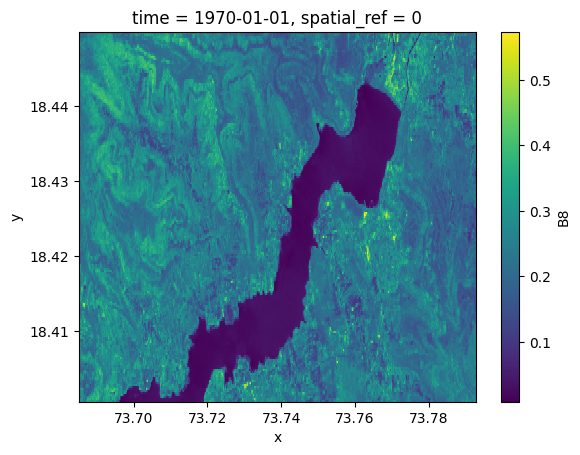

In [45]:
ds_sentinel.B8.plot()

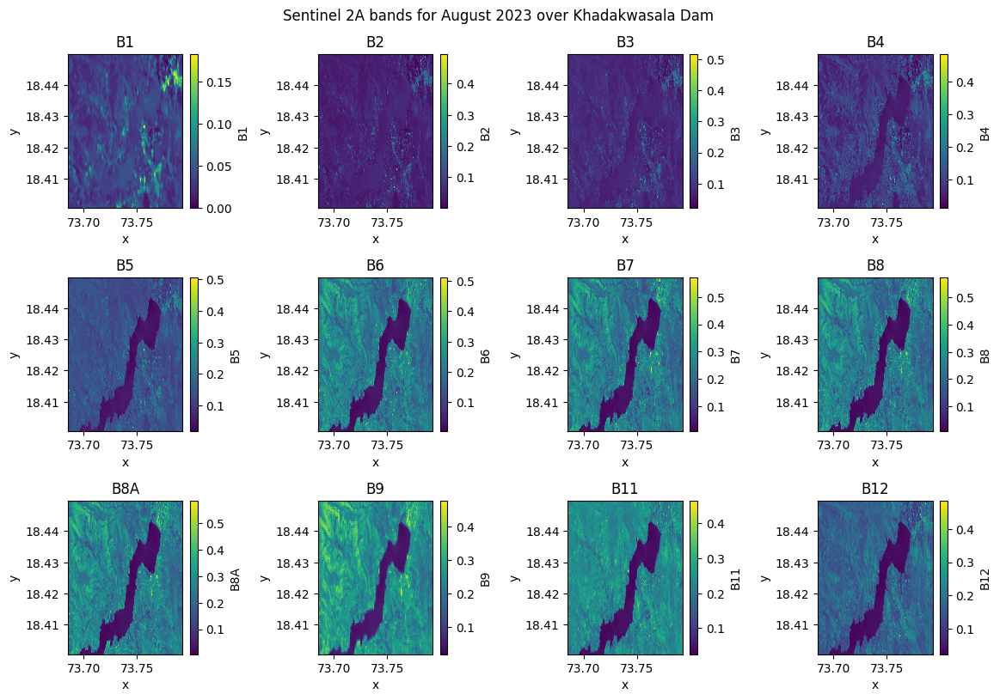

In [46]:
import matplotlib.pyplot as plt
fig,ax = plt.subplots(ncols=4,nrows=3, figsize=(11.69,8.27))
vars = ['B1', 'B2', 'B3', 'B4', 'B5', 'B6', 'B7', 'B8', 'B8A', 'B9', 'B11', 'B12']
cnt=0
for i in range(3):
    for j in range(4):
        ds_sentinel[vars[cnt]].plot(ax=ax[i,j])
        ax[i,j].set_title(vars[cnt])
        cnt = cnt+1
fig.suptitle('Sentinel 2A bands for August 2023 over Khadakwasala Dam')
fig.tight_layout()
plt.savefig('sentinel_bands.png', dpi=500)

In [47]:
df_B1_sentinel_df = ds_sentinel.isel(time=0).B1.to_dataframe().reset_index()

In [48]:
df_B1_sentinel_df

,y,x,time,spatial_ref,B1
0,18.449734,73.685344,1970-01-01,0,0.03100
1,18.449734,73.685614,1970-01-01,0,0.03660
2,18.449734,73.685883,1970-01-01,0,0.03660
3,18.449734,73.686153,1970-01-01,0,0.03660
4,18.449734,73.686422,1970-01-01,0,0.04020
...,...,...,...,...,...
73012,18.400686,73.791525,1970-01-01,0,0.03995
73013,18.400686,73.791795,1970-01-01,0,0.03960
73014,18.400686,73.792064,1970-01-01,0,0.03960
73015,18.400686,73.792334,1970-01-01,0,0.03515


In [49]:
# import plotly.express as px
# # df = px.data.carshare()
# fig = px.scatter_mapbox(df_B1_sentinel_df, lat="y", lon="x", color="B1",
#                   color_continuous_scale=px.colors.cyclical.IceFire, size_max=5, zoom=12,
#                   mapbox_style="carto-positron")
# #fig.write_image("sentinel_b1.png", engine="kaleido")
# fig.show()

# Landsat-8

In [50]:
def applyScaleFactors(image):
    opticalBands = image.select('SR_B.').multiply(0.0000275).add(-0.2)
    thermalBands = image.select('ST_B.*').multiply(0.00341802).add(149.0)
    return image.addBands(opticalBands, None, True).addBands(thermalBands, None, True)

In [51]:
# start_date = '2019-12-01'
# end_date   = '2020-01-30'
dataset = ee.ImageCollection('LANDSAT/LC08/C02/T1_L2').filterDate(start_date, end_date).filterBounds(aoi)
dataset = dataset.map(applyScaleFactors)
dataset = dataset.set('system:time_start', 0)
ds_landsat = dataset.wx.to_xarray(region=aoi.bounds(), scale=30)#,  crs='EPSG:32645')

Requesting data:   0%|          | 0/2 [00:00<?, ?it/s]

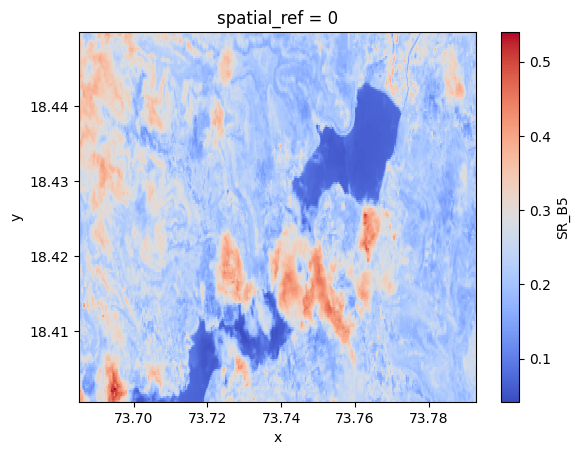

In [52]:
ds_landsat.SR_B5.mean(dim='time').plot(cmap='coolwarm')

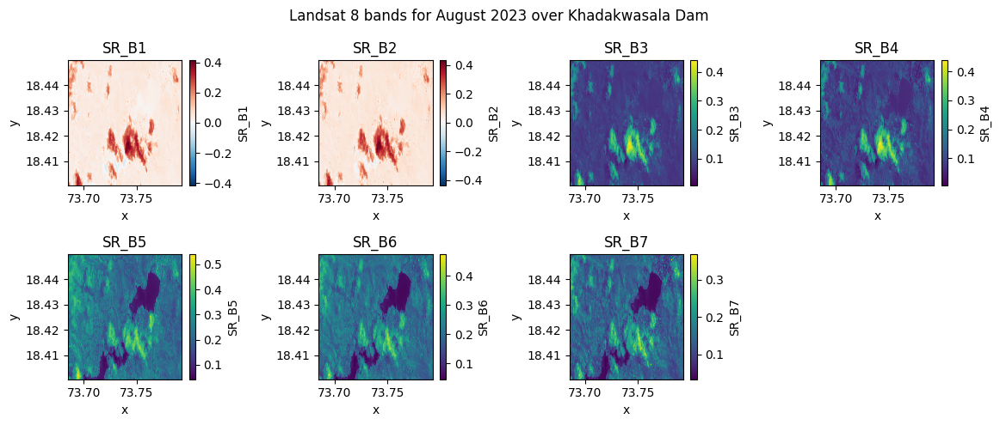

In [53]:
import matplotlib.pyplot as plt

fig, ax = plt.subplots(ncols=4, nrows=2, figsize=(11.69, 5))
vars = ['SR_B1', 'SR_B2', 'SR_B3', 'SR_B4', 'SR_B5', 'SR_B6', 'SR_B7']
cnt = 0

for i in range(2):
    for j in range(4):
        if cnt < len(vars):  # Check to prevent IndexError
            ds_landsat[vars[cnt]].mean(dim='time').plot(ax=ax[i, j])
            ax[i, j].set_title(vars[cnt])
            cnt += 1
        else:
            fig.delaxes(ax[i, j])  # Remove unused subplot

fig.suptitle('Landsat 8 bands for August 2023 over Khadakwasala Dam')
fig.tight_layout()
plt.savefig('landsat_bands.png', dpi=500)

# Icesat-2

In [54]:
!pip install --upgrade icepyx

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.6/56.6 kB 3.2 MB/s eta 0:00:00
INFO: pip is looking at multiple versions of dask-expr to determine which version is compatible with other requirements. This could take a while.
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 77.1/77.1 kB 5.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 60.5/60.5 kB 5.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 183.9/183.9 kB 9.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 18.3/18.3 MB 100.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 17.3/17.3 MB 94.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 161.9/161.9 kB 14.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 77.8/77.8 kB 8.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 243.2/243.2 kB 18.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.3/13.3 MB 96.7 MB/s eta 0:00:00
  Attempting uninstall: fsspec
    Found existing installati

<ipython-input-55-d6800ec2db04>:1: FutureWarning:

icepyx v1.x is being deprecated; the back-end systems on which it relies
will be shut down as of late 2024. At that time, upgrade to icepyx v2.x, which uses the
new NASA Harmony back-end, will be required. Please see
<https://icepyx.readthedocs.io/en/latest/user_guide/changelog/v1.3.0.html> for more
information!




<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
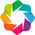

Total number of data order requests is  1  for  10  granules.
Data request  1  of  1  is submitting to NSIDC
Enter your Earthdata Login username: manmeet.singh@utexas.edu
Enter your Earthdata password: ··········
order ID:  5000005890828
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is: complete
NSIDC returned these messages
['Granule 296517349 contained no data within the spatial and/or temporal '
 'subset constraints to be processed',
 'Granule 296534209 contained no data within the spatial and/or temporal '
 'subset constraints to be processed',
 'Granule 296534195 contained no data within the spatial and/or temporal '
 'subset constraints to be processed',
 'Granule 296754931 contained no data within the spatial and/or temporal '
 'subset constraints to be processed',
 'Granule 296972735 contained no data within the spatial and/or temporal '
 'subset 

In [55]:
import icepyx as ipx
import numpy as np
!touch /root/.netrc
!echo "machine urs.earthdata.nasa.gov login ayantika03 password Climate2010" > /root/.netrc
!chmod 0600 /root/.netrc

earthdata_uid = 'ayantika03'
earthdata_email = 'ayantika.dey@gmail.com'

short_name = 'ATL13'

#spatial_extent = [-55, 68, -48, 71]
spatial_extent = [coords[0][0], coords[0][1], coords[-3][0],coords[-3][1]]

start_date = '2023-01-01'
end_date   = '2023-08-20'

# Given as longitude, latitude coordinate pairs
date_range = [start_date, end_date]

region_a = ipx.Query(short_name, spatial_extent, date_range)

# search for available granules using icepyx
# region_a.earthdata_login(earthdata_uid, earthdata_email)

path = './download'
!rm -rf ./download/*
region_a.download_granules(path)

In [56]:
!ls ./download

ls: cannot access './download': No such file or directory


In [ ]:
import h5py

# Open the file in read mode
file = h5py.File('./download/processed_ATL13_20191225001313_13610501_006_01.h5', 'r')
# List all groups
print("Keys: %s" % file.keys())

group_key = list(file.keys())[9]

# Get the group
group = file[group_key]
# Now you can access keys of the group, which are the variables
print("Group Keys: %s" % group.keys())

#lat, lon, water_depth = 2,3, -1

variable_key = list(group.keys())[3]
# Get the variable
variable = group[variable_key]
# Now you can access data of the variable
data = variable[:]
print(data)

Keys: <KeysViewHDF5 ['METADATA', 'ancillary_data', 'ds_anom_trigger', 'ds_sseg_quality', 'gt1l', 'gt1r', 'gt2l', 'gt2r', 'gt3l', 'gt3r', 'orbit_info', 'quality_assessment']>
Group Keys: <KeysViewHDF5 ['anom_ssegs', 'atl13refid', 'bottom_lat', 'bottom_lon', 'cloud_flag_asr_atl09', 'cloud_flag_atm_atl09', 'cycle_number', 'delta_time', 'err_ht_water_surf', 'err_slope_trk', 'ht_ortho', 'ht_water_surf', 'ice_flag', 'inland_water_body_id', 'inland_water_body_region', 'inland_water_body_size', 'inland_water_body_source', 'inland_water_body_type', 'layer_flag_atl09', 'met_ts_atl09', 'met_wind10_atl09', 'met_wind10_atl13', 'qf_bckgrd', 'qf_bias_em', 'qf_bias_fit', 'qf_cloud', 'qf_ht_adj', 'qf_ice', 'qf_iwp', 'qf_lseg_length', 'qf_spec_width', 'qf_sseg_length', 'qf_stdev_lseg', 'qf_stdev_vlseg', 'qf_subsurf_anomaly', 'qf_subsurface_attenuation', 'qf_subsurface_backscat_ampltd', 'rgt', 'segment_apparent_ht', 'segment_azimuth', 'segment_bias_em', 'segment_bias_fit', 'segment_dac', 'segment_dem_ht'

In [ ]:
# path = './download/'
# pattern = "processed_ATL{product:2}_{datetime:%Y%m%d%H%M%S}_{rgt:4}{cycle:2}{orbitsegment:2}_{version:3}_{revision:2}.h5"
# reader = ipx.Read(path, "ATL13", pattern)

# lats_ = []
# lons_ = []
# ht_water_surface_ = []
# err_ht_water_surface_ = []
# import glob
# import h5py

# for filepath in glob.iglob('./download/*.h5'):
#     print(filepath)
#     with h5py.File(filepath, mode='r') as f:

#         latvar = f['/gt3r/bottom_lat']
#         latitude = latvar[:]

#         lonvar = f['/gt3r/bottom_lon']
#         longitude = lonvar[:]

#         dset_name = '/gt3r/segment_geoid'
#         datavar = f[dset_name]
#         geoid = datavar[:]

#         datavar = f['/gt3r/ht_ortho']
#         ht_ortho = datavar[:]

#         datavar = f['/gt3r/water_depth']
#         ht_water_surf = datavar[:]


#         datavar = f['/gt3r/err_ht_water_surf']
#         err_ht_water_surf = datavar[:]

#         units = datavar.attrs['units']
#         long_name = datavar.attrs['long_name']
#         _FillValue = datavar.attrs['_FillValue']

#         # Handle FillValue
#         geoid[geoid == _FillValue] = np.nan
#         ht_water_surf[ht_water_surf == _FillValue] = np.nan
#         ht_ortho[ht_ortho == _FillValue] = np.nan
#         err_ht_water_surf[err_ht_water_surf == _FillValue] = np.nan
#         lats_.append(latitude)
#         lons_.append(longitude)
#         ht_water_surface_.append(ht_water_surf)
#         err_ht_water_surface_.append(err_ht_water_surf)

# lats__ = np.array([item for sublist in lats_ for item in sublist])
# lons__ = np.array([item for sublist in lons_ for item in sublist])
# ht_water_surface__ = np.array([item for sublist in ht_water_surface_ for item in sublist])
# err_ht_water_surface__ = np.array([item for sublist in err_ht_water_surface_ for item in sublist])

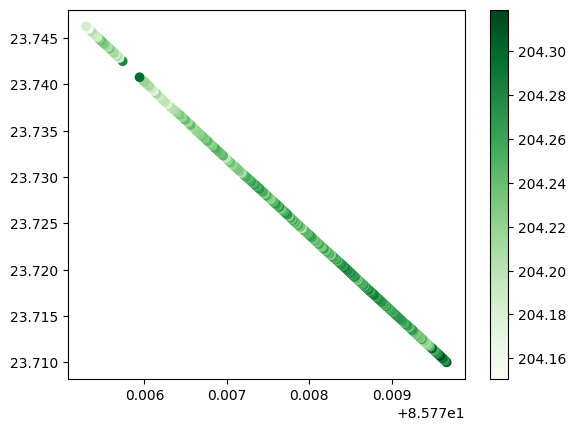

In [ ]:
import matplotlib.pyplot as plt
#ax = plt.axes(projection='3d')
plt.scatter(lons__, lats__, c=ht_water_surface__, cmap='Greens')
plt.colorbar()

In [ ]:
import plotly.express as px
# df = px.data.carshare()
fig = px.scatter_mapbox(df_icesat, lat="x", lon="y", color="icesat_data",
                  color_continuous_scale=px.colors.cyclical.IceFire, size_max=5, zoom=12,
                  mapbox_style="carto-positron")
fig.show()

In [ ]:
ht_water_surface__

array([204.31064, 204.29868, 204.27911, 204.26178, 204.2799 , 204.29974,
       204.28564, 204.31549, 204.31906, 204.28677, 204.2832 , 204.26495,
       204.27728, 204.26544, 204.24957, 204.25519, 204.29956, 204.31601,
       204.25607, 204.26071, 204.24197, 204.23494, 204.23668, 204.22298,
       204.20885, 204.22096, 204.23354, 204.2086 , 204.20433, 204.20424,
       204.19595, 204.22049, 204.2262 , 204.2182 , 204.21802, 204.21884,
       204.25262, 204.25815, 204.26147, 204.23456, 204.21423, 204.2312 ,
       204.23288, 204.2201 , 204.23846, 204.23318, 204.21696, 204.23988,
       204.24815, 204.2375 , 204.24092, 204.20767, 204.23056, 204.22458,
       204.24243, 204.22803, 204.23856, 204.2528 , 204.26901, 204.26898,
       204.25621, 204.23227, 204.26205, 204.27142, 204.25128, 204.26425,
       204.2713 , 204.27118, 204.26907, 204.25368, 204.26459, 204.25899,
       204.25415, 204.24596, 204.27339, 204.24701, 204.24158, 204.27336,
       204.23787, 204.27281, 204.26994, 204.26596, 

In [ ]:
import pandas as pd
dict_ = {'y':lons__, 'x':lats__, 'icesat_data':ht_water_surface__}
df_icesat = pd.DataFrame(dict_)
df_icesat

,y,x,icesat_data
0,85.779668,23.710020,204.310638
1,85.779659,23.710096,204.298676
2,85.779648,23.710190,204.279114
3,85.779637,23.710285,204.261780
4,85.779626,23.710374,204.279907
...,...,...,...
277,85.775405,23.745266,204.187317
278,85.775380,23.745475,204.190948
279,85.775353,23.745705,204.206070
280,85.775325,23.745944,204.150497


In [ ]:
import xarray as xr

In [ ]:
# Create an xarray Dataset
ds_icesat = xr.Dataset(
    {
        "icesat_data": (["points"], df_icesat.icesat_data.values)
    },
    coords={
        "latitude": (["points"], df_icesat.x.values[:len(df_icesat.icesat_data.values)]),
        "longitude": (["points"], df_icesat.y.values[:len(df_icesat.icesat_data.values)])
    }
)
ds_icesat

<xarray.Dataset>
Dimensions:      (points: 282)
Coordinates:
    latitude     (points) float64 23.71 23.71 23.71 23.71 ... 23.75 23.75 23.75
    longitude    (points) float64 85.78 85.78 85.78 85.78 ... 85.78 85.78 85.78
Dimensions without coordinates: points
Data variables:
    icesat_data  (points) float32 204.3 204.3 204.3 204.3 ... 204.2 204.2 204.2

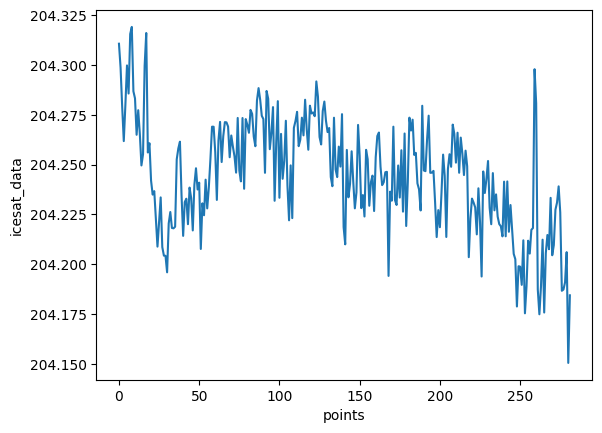

In [ ]:
ds_icesat.icesat_data.plot()

In [ ]:
def distance(lat1, lon1, lat2, lon2):
    p = 0.017453292519943295
    hav = 0.5 - np.cos((lat2-lat1)*p)/2 + np.cos(lat1*p)*np.cos(lat2*p) * (1-np.cos((lon2-lon1)*p)) / 2
    return 12742 * np.arcsin(np.sqrt(hav))

def closest(data, v):
    return min(data, key=lambda p: distance(v['y'],v['x'],p['y'],p['x']))
# tempDataList = [{'lat': 39.7612992, 'lon': -86.1519681},
#                 {'lat': 39.762241,  'lon': -86.158436 },
#                 {'lat': 39.7622292, 'lon': -86.1578917}]

v = {'y': 23.710020, 'x': 	85.779668}
#print(closest(tempDataList, v))

In [ ]:
distance(23.710020, 85.779668, 23.710096, 85.779659)

0.008501290591972816

In [ ]:
def closest(df_survey, df_icesat, lat_, lon_):
    closest_lat_lon_index = 0
    dist__ = distance(df_survey['lat'].iloc[0], df_survey['lon'].iloc[0], lat_, lon_)
    for i_ in range(1,df_survey.shape[0]):
        dist_ = distance(df_survey['lat'].iloc[i_], df_survey['lon'].iloc[i_], lat_, lon_)
        if dist_ < dist__:
            closest_lat_lon_index = i_
            dist__ = dist_
    return closest_lat_lon_index

In [ ]:
survey_data_closest_to_icesat = []
for i_ in range(df_icesat.shape[0]):
    survey_data_closest_to_icesat.append(df_survey.iloc[closest(df_survey, df_icesat, df_icesat['x'].iloc[-1], df_icesat['y'].iloc[-1])]['bathy'])

In [ ]:
survey_data_closest_to_icesat

[0.44999999999998863,
 0.44999999999998863,
 0.44999999999998863,
 0.44999999999998863,
 0.44999999999998863,
 0.44999999999998863,
 0.44999999999998863,
 0.44999999999998863,
 0.44999999999998863,
 0.44999999999998863,
 0.44999999999998863,
 0.44999999999998863,
 0.44999999999998863,
 0.44999999999998863,
 0.44999999999998863,
 0.44999999999998863,
 0.44999999999998863,
 0.44999999999998863,
 0.44999999999998863,
 0.44999999999998863,
 0.44999999999998863,
 0.44999999999998863,
 0.44999999999998863,
 0.44999999999998863,
 0.44999999999998863,
 0.44999999999998863,
 0.44999999999998863,
 0.44999999999998863,
 0.44999999999998863,
 0.44999999999998863,
 0.44999999999998863,
 0.44999999999998863,
 0.44999999999998863,
 0.44999999999998863,
 0.44999999999998863,
 0.44999999999998863,
 0.44999999999998863,
 0.44999999999998863,
 0.44999999999998863,
 0.44999999999998863,
 0.44999999999998863,
 0.44999999999998863,
 0.44999999999998863,
 0.44999999999998863,
 0.44999999999998863,
 0.4499999

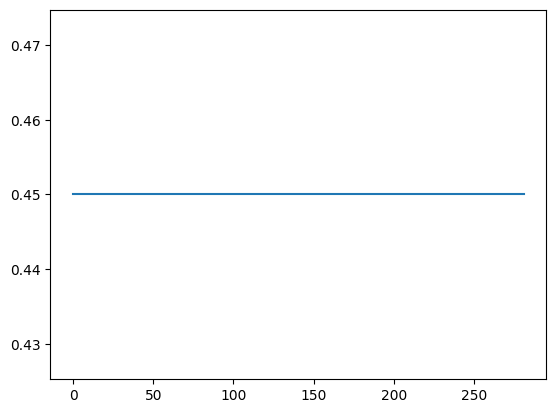

In [ ]:
plt.plot(survey_data_closest_to_icesat)

So, we can get the linear scaling relationship between the bathymetry survey and Icesat-2 data

In [ ]:
# import plotly.express as px
# # df = px.data.carshare()
# fig = px.scatter_mapbox(df_icesat, lat="y", lon="x", color="icesat_data",
#                   color_continuous_scale=px.colors.cyclical.IceFire, size_max=5, zoom=12,
#                   mapbox_style="carto-positron")
# fig.show()

In [ ]:
# Todo
# Get the bathy survey data for the Icesat-2 track and compare it with the volume of water in the reservoir
# Experiment with ATL03 and ATL08 products as well

# GEDI

In [57]:
def qualityMask(im):
    return im.updateMask(im.select('quality_flag').eq(1)).select('rh98').toInt()

In [58]:
date_range = ['2023-06-01','2023-08-23']

In [59]:
gedi = ee.ImageCollection('LARSE/GEDI/GEDI02_A_002_MONTHLY').map(qualityMask).filterBounds(aoi).filterDate('2023-06-01','2023-08-23')
ds = gedi.wx.to_xarray(region=aoi.bounds(), scale=25)

Requesting data: 0it [00:00, ?it/s]

In [60]:
ds.rh98.values.shape

AttributeError: 'Dataset' object has no attribute 'rh98'

In [ ]:
df_ = pd.DataFrame()
for i in range(ds.rh98.values.shape[0]):
    df = ds.rh98.isel(time=i).to_dataframe().reset_index().dropna()
    df_ = df_.append(df)

In [ ]:
df_gedi = df_.copy()
df_gedi

In [ ]:
import matplotlib.pyplot as plt
#ax = plt.axes(projection='3d')
#plt.scatter(lons__, lats__, c=ht_water_surface__, cmap='Greens')
plt.scatter(df_gedi['x'], df_gedi['y'], c=df_gedi['rh98'], cmap='Greens')
plt.colorbar()

NameError: ignored

In [ ]:
import plotly.express as px
# df = px.data.carshare()
fig = px.scatter_mapbox(df_gedi, lat="y", lon="x", color="rh98",
                  color_continuous_scale=px.colors.cyclical.IceFire, size_max=5, zoom=8,
                  mapbox_style="carto-positron")
fig.show()

NameError: ignored

In [ ]:
# Get the bathy survey data for the GEDI track and compare it with the volume of water in the reservoir

In [ ]:
# survey_data_closest_to_gedi = []
# for i_ in range(df_gedi.shape[0]):
#     survey_data_closest_to_gedi.append(df_survey.iloc[closest(df_survey, df_gedi, df_gedi['y'].iloc[-1], df_gedi['x'].iloc[-1])]['bathy'])

In [ ]:
# survey_data_closest_to_gedi

Values are coming because we are selecting the nearest survey data, we need to put a threshold on the distance

# Sentinel 3

In [ ]:
dataset = ee.ImageCollection('COPERNICUS/S3/OLCI').filterDate('2023-06-01','2023-08-23').filterBounds(aoi).select('Oa07_radiance').median() \
              .multiply(ee.Image([0.00879161]))

In [ ]:
dataset = dataset.set('system:time_start', 0)
ds = dataset.wx.to_xarray(region=aoi.bounds(), scale=300)

Downloading:   0%|          | 0.00/4.56k [00:00<?, ?iB/s]

In [ ]:
ds

<xarray.Dataset>
Dimensions:        (time: 1, x: 40, y: 20)
Coordinates:
  * time           (time) datetime64[ns] 1970-01-01
  * x              (x) float64 73.69 73.69 73.69 73.69 ... 73.79 73.79 73.79
  * y              (y) float64 18.45 18.45 18.45 18.44 ... 18.41 18.41 18.4 18.4
    spatial_ref    int64 0
Data variables:
    Oa07_radiance  (time, y, x) float64 2.202 2.204 2.136 ... 1.941 1.917 1.985
Attributes:
    AREA_OR_POINT:           Area
    TIFFTAG_RESOLUTIONUNIT:  1 (unitless)
    TIFFTAG_XRESOLUTION:     1
    TIFFTAG_YRESOLUTION:     1
    _FillValue:              -32768.0
    scale_factor:            1.0
    add_offset:              0.0

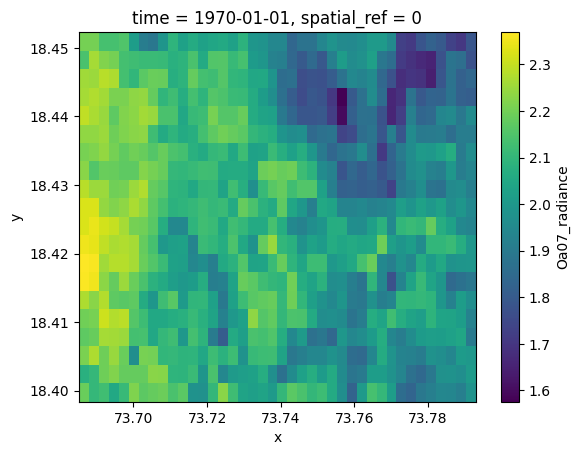

In [ ]:
ds.Oa07_radiance.plot()

# Time series of sedimentation using Sentinel 3

In [ ]:
from tqdm import tqdm
from datetime import date
sedimentation_ = []
precipitation_ = []
times_ = []
for year in tqdm(range(2017,2024)):
    for mon in range(1,13):
        try:
            dataset = ee.ImageCollection('COPERNICUS/S3/OLCI').filterDate(date(year, mon, 1).strftime("%Y-%m-%d"), date(year, mon, 28).strftime("%Y-%m-%d")).filterBounds(aoi).select('Oa07_radiance').median() \
                    .multiply(ee.Image([0.00879161]))
            dataset = dataset.set('system:time_start', 0)
            ds = dataset.wx.to_xarray(region=aoi.bounds(), scale=300)
            sedimentation_.append(ds.Oa07_radiance.mean(dim='time').mean(dim='x').mean(dim='y').values.flatten()[0])
            times_.append(date(year, mon, 1).strftime("%Y-%m-%d"))
            dataset = ee.ImageCollection('JAXA/GPM_L3/GSMaP/v6/operational').filterDate(date(year, mon, 1).strftime("%Y-%m-%d"), date(year, mon, 28).strftime("%Y-%m-%d")).filterBounds(aoi).select('hourlyPrecipRate').sum()
            dataset = dataset.set('system:time_start', 0)
            ds = dataset.wx.to_xarray(region=aoi.bounds(), scale=11132)
            precipitation_.append(ds.hourlyPrecipRate.sum(dim='time').sum(dim='x').sum(dim='y').values.flatten()[0])
        except:
            continue

  0%|          | 0/7 [00:00<?, ?it/s]

Downloading:   0%|          | 0.00/2.35k [00:00<?, ?iB/s]

Downloading:   0%|          | 0.00/1.08k [00:00<?, ?iB/s]

Downloading:   0%|          | 0.00/3.06k [00:00<?, ?iB/s]

Downloading:   0%|          | 0.00/1.08k [00:00<?, ?iB/s]

Downloading:   0%|          | 0.00/2.70k [00:00<?, ?iB/s]

Downloading:   0%|          | 0.00/1.08k [00:00<?, ?iB/s]

Downloading:   0%|          | 0.00/2.69k [00:00<?, ?iB/s]

Downloading:   0%|          | 0.00/1.08k [00:00<?, ?iB/s]

Downloading:   0%|          | 0.00/2.52k [00:00<?, ?iB/s]

Downloading:   0%|          | 0.00/1.10k [00:00<?, ?iB/s]

Downloading:   0%|          | 0.00/3.71k [00:00<?, ?iB/s]

Downloading:   0%|          | 0.00/1.10k [00:00<?, ?iB/s]

Downloading:   0%|          | 0.00/2.97k [00:00<?, ?iB/s]

Downloading:   0%|          | 0.00/1.10k [00:00<?, ?iB/s]

Downloading:   0%|          | 0.00/3.50k [00:00<?, ?iB/s]

Downloading:   0%|          | 0.00/1.10k [00:00<?, ?iB/s]

Downloading:   0%|          | 0.00/3.54k [00:00<?, ?iB/s]

Downloading:   0%|          | 0.00/1.10k [00:00<?, ?iB/s]

Downloading:   0%|          | 0.00/2.74k [00:00<?, ?iB/s]

Downloading:   0%|          | 0.00/1.10k [00:00<?, ?iB/s]

Downloading:   0%|          | 0.00/2.16k [00:00<?, ?iB/s]

Downloading:   0%|          | 0.00/1.10k [00:00<?, ?iB/s]

Downloading:   0%|          | 0.00/2.22k [00:00<?, ?iB/s]

Downloading:   0%|          | 0.00/1.10k [00:00<?, ?iB/s]

 14%|█▍        | 1/7 [01:35<09:34, 95.78s/it]

Downloading:   0%|          | 0.00/2.23k [00:00<?, ?iB/s]

Downloading:   0%|          | 0.00/1.08k [00:00<?, ?iB/s]

Downloading:   0%|          | 0.00/2.31k [00:00<?, ?iB/s]

Downloading:   0%|          | 0.00/1.10k [00:00<?, ?iB/s]

Downloading:   0%|          | 0.00/2.37k [00:00<?, ?iB/s]

Downloading:   0%|          | 0.00/1.10k [00:00<?, ?iB/s]

Downloading:   0%|          | 0.00/2.51k [00:00<?, ?iB/s]

Downloading:   0%|          | 0.00/1.10k [00:00<?, ?iB/s]

Downloading:   0%|          | 0.00/3.56k [00:00<?, ?iB/s]

Downloading:   0%|          | 0.00/1.10k [00:00<?, ?iB/s]

Downloading:   0%|          | 0.00/2.48k [00:00<?, ?iB/s]

Downloading:   0%|          | 0.00/1.10k [00:00<?, ?iB/s]

Downloading:   0%|          | 0.00/2.56k [00:00<?, ?iB/s]

Downloading:   0%|          | 0.00/1.10k [00:00<?, ?iB/s]

Downloading:   0%|          | 0.00/2.44k [00:00<?, ?iB/s]

Downloading:   0%|          | 0.00/1.08k [00:00<?, ?iB/s]

 29%|██▊       | 2/7 [02:36<06:14, 74.98s/it]

Downloading:   0%|          | 0.00/2.13k [00:00<?, ?iB/s]

Downloading:   0%|          | 0.00/1.08k [00:00<?, ?iB/s]

Downloading:   0%|          | 0.00/2.77k [00:00<?, ?iB/s]

Downloading:   0%|          | 0.00/1.08k [00:00<?, ?iB/s]

Downloading:   0%|          | 0.00/3.02k [00:00<?, ?iB/s]

Downloading:   0%|          | 0.00/1.08k [00:00<?, ?iB/s]

Downloading:   0%|          | 0.00/2.92k [00:00<?, ?iB/s]

Downloading:   0%|          | 0.00/1.10k [00:00<?, ?iB/s]

Downloading:   0%|          | 0.00/2.88k [00:00<?, ?iB/s]

Downloading:   0%|          | 0.00/1.09k [00:00<?, ?iB/s]

Downloading:   0%|          | 0.00/3.57k [00:00<?, ?iB/s]

Downloading:   0%|          | 0.00/1.10k [00:00<?, ?iB/s]

Downloading:   0%|          | 0.00/3.33k [00:00<?, ?iB/s]

Downloading:   0%|          | 0.00/1.10k [00:00<?, ?iB/s]

Downloading:   0%|          | 0.00/4.04k [00:00<?, ?iB/s]

Downloading:   0%|          | 0.00/1.10k [00:00<?, ?iB/s]

Downloading:   0%|          | 0.00/3.66k [00:00<?, ?iB/s]

Downloading:   0%|          | 0.00/1.10k [00:00<?, ?iB/s]

Downloading:   0%|          | 0.00/3.79k [00:00<?, ?iB/s]

Downloading:   0%|          | 0.00/1.10k [00:00<?, ?iB/s]

Downloading:   0%|          | 0.00/2.58k [00:00<?, ?iB/s]

Downloading:   0%|          | 0.00/1.10k [00:00<?, ?iB/s]

Downloading:   0%|          | 0.00/2.48k [00:00<?, ?iB/s]

Downloading:   0%|          | 0.00/1.10k [00:00<?, ?iB/s]

 43%|████▎     | 3/7 [03:54<05:06, 76.71s/it]

Downloading:   0%|          | 0.00/2.39k [00:00<?, ?iB/s]

Downloading:   0%|          | 0.00/1.08k [00:00<?, ?iB/s]

Downloading:   0%|          | 0.00/2.61k [00:00<?, ?iB/s]

Downloading:   0%|          | 0.00/1.08k [00:00<?, ?iB/s]

Downloading:   0%|          | 0.00/2.81k [00:00<?, ?iB/s]

Downloading:   0%|          | 0.00/1.10k [00:00<?, ?iB/s]

Downloading:   0%|          | 0.00/2.28k [00:00<?, ?iB/s]

Downloading:   0%|          | 0.00/1.10k [00:00<?, ?iB/s]

Downloading:   0%|          | 0.00/2.57k [00:00<?, ?iB/s]

Downloading:   0%|          | 0.00/1.10k [00:00<?, ?iB/s]

Downloading:   0%|          | 0.00/4.07k [00:00<?, ?iB/s]

Downloading:   0%|          | 0.00/1.10k [00:00<?, ?iB/s]

Downloading:   0%|          | 0.00/4.68k [00:00<?, ?iB/s]

Downloading:   0%|          | 0.00/1.10k [00:00<?, ?iB/s]

Downloading:   0%|          | 0.00/3.47k [00:00<?, ?iB/s]

Downloading:   0%|          | 0.00/1.10k [00:00<?, ?iB/s]

Downloading:   0%|          | 0.00/4.22k [00:00<?, ?iB/s]

Downloading:   0%|          | 0.00/1.10k [00:00<?, ?iB/s]

Downloading:   0%|          | 0.00/3.29k [00:00<?, ?iB/s]

Downloading:   0%|          | 0.00/1.10k [00:00<?, ?iB/s]

Downloading:   0%|          | 0.00/2.33k [00:00<?, ?iB/s]

Downloading:   0%|          | 0.00/1.10k [00:00<?, ?iB/s]

 57%|█████▋    | 4/7 [05:08<03:46, 75.49s/it]

Downloading:   0%|          | 0.00/2.26k [00:00<?, ?iB/s]

Downloading:   0%|          | 0.00/1.10k [00:00<?, ?iB/s]

Downloading:   0%|          | 0.00/2.18k [00:00<?, ?iB/s]

Downloading:   0%|          | 0.00/1.10k [00:00<?, ?iB/s]

Downloading:   0%|          | 0.00/1.93k [00:00<?, ?iB/s]

Downloading:   0%|          | 0.00/1.10k [00:00<?, ?iB/s]

Downloading:   0%|          | 0.00/2.58k [00:00<?, ?iB/s]

Downloading:   0%|          | 0.00/1.10k [00:00<?, ?iB/s]

Downloading:   0%|          | 0.00/2.54k [00:00<?, ?iB/s]

Downloading:   0%|          | 0.00/1.10k [00:00<?, ?iB/s]

Downloading:   0%|          | 0.00/4.16k [00:00<?, ?iB/s]

Downloading:   0%|          | 0.00/1.10k [00:00<?, ?iB/s]

Downloading:   0%|          | 0.00/3.99k [00:00<?, ?iB/s]

Downloading:   0%|          | 0.00/1.10k [00:00<?, ?iB/s]

Downloading:   0%|          | 0.00/3.79k [00:00<?, ?iB/s]

Downloading:   0%|          | 0.00/1.10k [00:00<?, ?iB/s]

Downloading:   0%|          | 0.00/4.61k [00:00<?, ?iB/s]

Downloading:   0%|          | 0.00/1.10k [00:00<?, ?iB/s]

Downloading:   0%|          | 0.00/2.86k [00:00<?, ?iB/s]

Downloading:   0%|          | 0.00/1.10k [00:00<?, ?iB/s]

Downloading:   0%|          | 0.00/2.59k [00:00<?, ?iB/s]

Downloading:   0%|          | 0.00/1.10k [00:00<?, ?iB/s]

Downloading:   0%|          | 0.00/2.29k [00:00<?, ?iB/s]

Downloading:   0%|          | 0.00/1.10k [00:00<?, ?iB/s]

 71%|███████▏  | 5/7 [06:29<02:35, 77.52s/it]

Downloading:   0%|          | 0.00/2.41k [00:00<?, ?iB/s]

Downloading:   0%|          | 0.00/1.08k [00:00<?, ?iB/s]

Downloading:   0%|          | 0.00/2.35k [00:00<?, ?iB/s]

Downloading:   0%|          | 0.00/1.08k [00:00<?, ?iB/s]

Downloading:   0%|          | 0.00/2.49k [00:00<?, ?iB/s]

Downloading:   0%|          | 0.00/1.10k [00:00<?, ?iB/s]

Downloading:   0%|          | 0.00/2.50k [00:00<?, ?iB/s]

Downloading:   0%|          | 0.00/1.10k [00:00<?, ?iB/s]

Downloading:   0%|          | 0.00/2.54k [00:00<?, ?iB/s]

Downloading:   0%|          | 0.00/1.10k [00:00<?, ?iB/s]

Downloading:   0%|          | 0.00/4.22k [00:00<?, ?iB/s]

Downloading:   0%|          | 0.00/1.10k [00:00<?, ?iB/s]

Downloading:   0%|          | 0.00/3.55k [00:00<?, ?iB/s]

Downloading:   0%|          | 0.00/1.10k [00:00<?, ?iB/s]

Downloading:   0%|          | 0.00/3.85k [00:00<?, ?iB/s]

Downloading:   0%|          | 0.00/1.10k [00:00<?, ?iB/s]

Downloading:   0%|          | 0.00/4.40k [00:00<?, ?iB/s]

Downloading:   0%|          | 0.00/1.10k [00:00<?, ?iB/s]

Downloading:   0%|          | 0.00/4.17k [00:00<?, ?iB/s]

Downloading:   0%|          | 0.00/1.10k [00:00<?, ?iB/s]

Downloading:   0%|          | 0.00/2.33k [00:00<?, ?iB/s]

Downloading:   0%|          | 0.00/1.09k [00:00<?, ?iB/s]

Downloading:   0%|          | 0.00/2.32k [00:00<?, ?iB/s]

Downloading:   0%|          | 0.00/1.08k [00:00<?, ?iB/s]

 86%|████████▌ | 6/7 [07:40<01:15, 75.32s/it]

Downloading:   0%|          | 0.00/2.15k [00:00<?, ?iB/s]

Downloading:   0%|          | 0.00/1.09k [00:00<?, ?iB/s]

Downloading:   0%|          | 0.00/2.42k [00:00<?, ?iB/s]

Downloading:   0%|          | 0.00/1.08k [00:00<?, ?iB/s]

Downloading:   0%|          | 0.00/2.41k [00:00<?, ?iB/s]

Downloading:   0%|          | 0.00/1.10k [00:00<?, ?iB/s]

Downloading:   0%|          | 0.00/2.59k [00:00<?, ?iB/s]

Downloading:   0%|          | 0.00/1.10k [00:00<?, ?iB/s]

Downloading:   0%|          | 0.00/2.15k [00:00<?, ?iB/s]

Downloading:   0%|          | 0.00/1.10k [00:00<?, ?iB/s]

Downloading:   0%|          | 0.00/3.25k [00:00<?, ?iB/s]

Downloading:   0%|          | 0.00/1.10k [00:00<?, ?iB/s]

Downloading:   0%|          | 0.00/3.47k [00:00<?, ?iB/s]

Downloading:   0%|          | 0.00/1.10k [00:00<?, ?iB/s]

Downloading:   0%|          | 0.00/3.70k [00:00<?, ?iB/s]

Downloading:   0%|          | 0.00/1.10k [00:00<?, ?iB/s]

100%|██████████| 7/7 [08:31<00:00, 73.14s/it]


In [ ]:
import datetime as dt
dates_list = [dt.datetime.strptime(date, "%Y-%m-%d").date() for date in times_]
sedimentation_ = np.array(sedimentation_)
precipitation_ = np.array(precipitation_)

In [ ]:
import seaborn as sns
dict_ = {'Time': dates_list, 'Sedimentation':sedimentation_, 'Precipitation': precipitation_}
df = pd.DataFrame(dict_)

<Axes: xlabel='Time', ylabel='Sedimentation'>

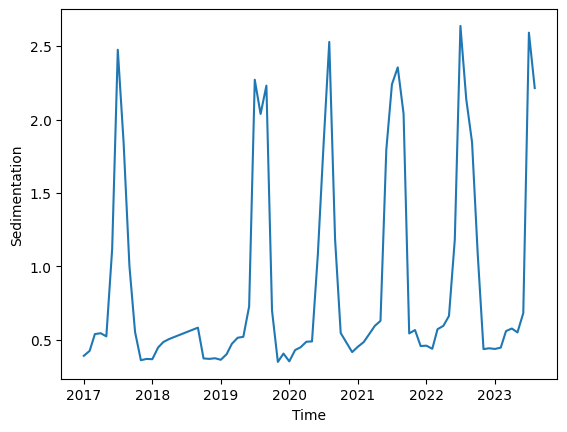

In [ ]:
sns.lineplot(x = "Time", y = "Sedimentation", data = df)

<Axes: xlabel='Time', ylabel='Precipitation'>

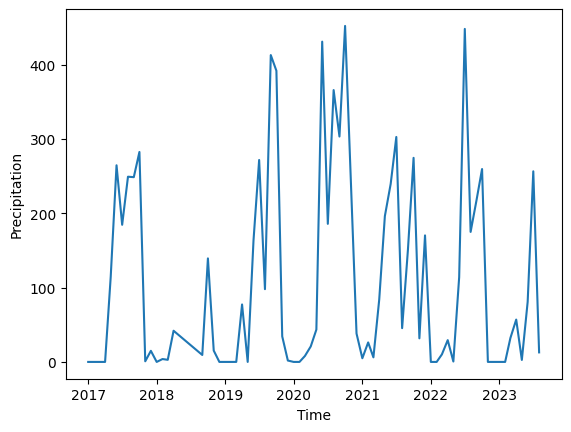

In [ ]:
sns.lineplot(x = "Time", y = "Precipitation", data = df)

# Dynamic World

In [ ]:
# #COL_FILTER = ee.Filter.and.( ee.Filter.bounds(aoi), ee.Filter.date('2021-09-01', '2021-09-30'))
# dwCol = ee.ImageCollection('GOOGLE/DYNAMICWORLD/V1').filterDate('2021-09-01', '2021-09-30').filterBounds(aoi)
# s2Col = ee.ImageCollection('COPERNICUS/S2').filterDate('2021-09-01', '2021-09-30').filterBounds(aoi)
# #DwS2Col = ee.Join.saveFirst('s2_img').apply(dwCol, s2Col,ee.Filter.equals({leftField: 'system:index', rightField: 'system:index'}))
# CLASS_NAMES = ['water', 'trees', 'grass', 'flooded_vegetation', 'crops', 'shrub_and_scrub', 'built', 'bare', 'snow_and_ice']
# dwImage = ee.Image(dwCol.first())
# VIS_PALETTE = [ '419BDF', '397D49', '88B053', '7A87C6', 'E49635', 'DFC35A', 'C4281B', 'A59B8F', 'B39FE1']
# dwRgb = dwImage.select('label').visualize({'min': 0, 'max': 8, 'palette': VIS_PALETTE}).divide(255)
# top1Prob = dwImage.select(CLASS_NAMES).reduce(ee.Reducer.max())
# top1ProbHillshade = ee.Terrain.hillshade(top1Prob.multiply(100)).divide(255)

In [ ]:
# dwRgbHillshade = dwRgb.multiply(top1ProbHillshade)

In [ ]:
# ds = dwRgbHillshade.wx.to_xarray(region=aoi.bounds(), scale=10)

# NDWI

In [ ]:
# dataset = ee.ImageCollection('LANDSAT/LE07/C01/T1_32DAY_NDWI').filterDate('2022-01-01', '2022-04-30').filterBounds(aoi)
# ds_ndwi = dataset.wx.to_xarray(region=aoi.bounds(), scale=30)

In [ ]:
# # Define the image collection.
# collection = ee.ImageCollection('LANDSAT/LC09/C02/T1_L2')

# # Define a function to calculate NDWI.
# def calculate_ndwi(image):
#     ndwi = image.normalizedDifference(['SR_B3', 'SR_B5']).rename('NDWI')
#     return image.addBands(ndwi)

# # Map the function over the collection.
# ndwi_collection = collection.map(calculate_ndwi).filterDate('2022-01-01', '2022-01-30').filterBounds(aoi)
# ds_ndwi = ndwi_collection.wx.to_xarray(region=aoi.bounds(), scale=30)

In [ ]:
# ds_ndwi.NDWI

In [ ]:
# ds_ndwi.isel(time=0).NDWI.plot()

In [ ]:
# ndwi_ = ds_ndwi.isel(time=0).NDWI.values.copy()
# ndwi_[:,:] = 0.0
# bool_ = ds_ndwi.isel(time=0).NDWI.values>0.001
# np.sum(bool_)
# ndwi_[bool_] = 1.0
# ds_ndwi['NDWI_'] = (('y', 'x'), ndwi_)
# ds_ndwi.NDWI_.plot(cmap='Reds')
# print(np.nanmax(ds_ndwi.NDWI.values),np.nanmin(ds_ndwi.NDWI.values))

# Dynamic World

In [105]:
# Define the image collection.
collection = ee.ImageCollection('GOOGLE/DYNAMICWORLD/V1')

# Select the 'water' band.
water_collection = collection.select('water').filterDate('2023-01-01', '2023-12-31').filterBounds(aoi)
ds_dyn_water = water_collection.wx.to_xarray(region=aoi.bounds(), scale=30)

Requesting data:   0%|          | 0/43 [00:00<?, ?it/s]

In [106]:
ds_dyn_water

<xarray.Dataset> Size: 25MB
Dimensions:      (time: 43, x: 399, y: 183)
Coordinates:
  * time         (time) datetime64[ns] 344B 2023-01-04T05:43:54 ... 2023-12-3...
  * x            (x) float64 3kB 73.69 73.69 73.69 73.69 ... 73.79 73.79 73.79
  * y            (y) float64 1kB 18.45 18.45 18.45 18.45 ... 18.4 18.4 18.4 18.4
    spatial_ref  int64 8B 0
Data variables:
    water        (time, y, x) float64 25MB 0.02466 0.02475 ... 0.03322 0.03306
Attributes:
    TIFFTAG_XRESOLUTION:     1
    TIFFTAG_YRESOLUTION:     1
    TIFFTAG_RESOLUTIONUNIT:  1 (unitless)
    AREA_OR_POINT:           Area
    _FillValue:              -32768.0
    scale_factor:            1.0
    add_offset:              0.0

In [107]:
water = ds_dyn_water.water.mean(dim='time').values[:,:].copy()
water[:,:] = 0.0
bool_ = ds_dyn_water.water.mean(dim='time').values[:,:]>0.2
water[bool_] = 1.0
ds_dyn_water['water_mask'] = (( 'y', 'x'), water)

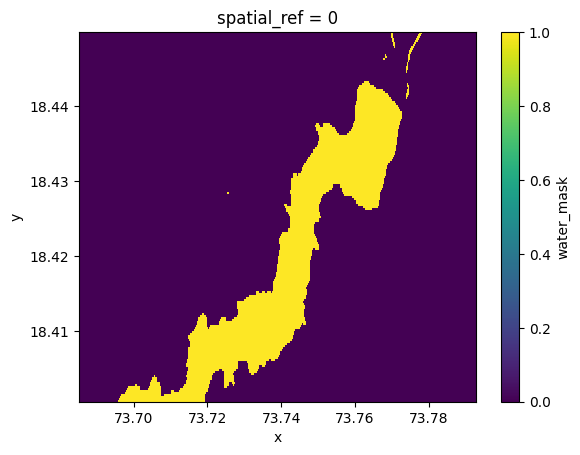

In [108]:
ds_dyn_water.water_mask.plot()

In [109]:
ds_ndwi = ds_dyn_water.copy()
ds_ndwi['NDWI_'] = ds_dyn_water['water_mask']

In [110]:
from tqdm import tqdm

In [ ]:
# df = pd.read_csv('drive/MyDrive/Bathy/Survey_Data/Tenughat/Tenughat_Dam.csv')
# epsg, hemisphere, north_south = get_epsg(dam_name='Tenughat', country='India')
# x_coord = df.EASTING.values
# y_coord = df.NORTHING.values
# latitude, longitude = utm.to_latlon(x_coord, y_coord, zone, northern=north_south)
# df['lat'] = latitude
# df['lon'] = longitude
# df['bathy'] = np.max(df.DEPTH.values) - df['DEPTH'].values

In [ ]:

from tqdm import tqdm

from pathlib import Path

directory = Path('drive/MyDrive/Bathy/Survey_Data/Khadakwasala/')
path = 'drive/MyDrive/Bathy/Survey_Data/Khadakwasala/'
df = pd.DataFrame()
for file in directory.glob('*.xyz'):
    print(file.name)
    df = pd.concat([df, pd.read_csv(path+file.name, header=None).iloc[6:]]).sort_index()

df_ = df.copy()
df_[[0, 1, 2]] = df_[0].str.split(' ', expand=True)
print(pd.isnull(df_.iloc[0,2]))
for i in tqdm(range(df_.shape[0])):
    #print(pd.isnull(df_.iloc[i,2]))
    if len(df_.iloc[i,2])==0:
        df_.iloc[i,2] = df_.iloc[i,3]
# df_


# df = pd.read_csv('drive/MyDrive/Bathy/Survey_Data/Kolkata_port_sea_channel/Eastern_Channe_January_2020.xyz', header=None)
# df = pd.concat([df, pd.read_csv('drive/MyDrive/Bathy/Survey_Data/Kolkata_port_sea_channel/Western_Channel_Dec_2019.XYZ', header=None)]).sort_index()
# epsg, hemisphere, north_south = '32645', 'northern', True
# # epsg, hemisphere, north_south = get_epsg(dam_name='Hirakud', country='India')
# zone = int(epsg[-2:])
# from tqdm import tqdm

# df_ = df.copy()
# df_[[0, 1, 2]] = df_[0].str.split('  ', expand=True)
# print(pd.isnull(df_.iloc[0,2]))
# for i in tqdm(range(df_.shape[0])):
#     #print(pd.isnull(df_.iloc[i,2]))
#     if len(df_.iloc[i,2])==0:
#         df_.iloc[i,2] = df_.iloc[i,3]
# df_.drop(df_.columns[3], axis=1, inplace=True)
df = df_.copy()
df = df.apply(pd.to_numeric, errors='coerce')
x_coord = df.values[:,0]
y_coord = df.values[:,1]
latitude, longitude = utm.to_latlon(x_coord, y_coord, zone, northern=north_south)
df['lat'] = latitude
df['lon'] = longitude
df['bathy'] = df.iloc[:,2] #np.max(df.iloc[:,2].values) - df.iloc[:,2].values

20230823_105055_S.xyz
20230823_111608_S.xyz
20230823_113129_S.xyz
20230823_113815_S.xyz
20230823_115540_S.xyz
20230823_122954_S.xyz
False


100%|██████████| 42552/42552 [00:00<00:00, 56923.98it/s]


In [ ]:
df

,0,1,2,lat,lon,bathy
6,367993.29,2039020.60,2.30,18.437276,73.750000,2.30
6,368651.84,2038757.26,9.49,18.434937,73.756252,9.49
6,367982.33,2039014.76,1.60,18.437222,73.749897,1.60
6,367997.24,2038958.20,5.36,18.436712,73.750042,5.36
6,369446.35,2038298.59,6.11,18.430842,73.763804,6.11
...,...,...,...,...,...,...
17168,367989.96,2039008.80,1.99,18.437169,73.749969,1.99
17169,367989.97,2039008.81,1.99,18.437169,73.749969,1.99
17170,367989.97,2039008.81,1.99,18.437169,73.749969,1.99
17171,367989.97,2039008.81,1.99,18.437169,73.749969,1.99


In [ ]:
lats_ = []
lons_ = []
bathy_ = []
sentinel_B1  = []
sentinel_B2  = []
sentinel_B3  = []
sentinel_B4  = []
sentinel_B5  = []
sentinel_B6  = []
sentinel_B7  = []
sentinel_B8  = []
sentinel_B8A = []
sentinel_B9  = []
sentinel_B11 = []
sentinel_B12 = []

landsat_B1 = []
landsat_B2 = []
landsat_B3 = []
landsat_B4 = []
landsat_B5 = []
landsat_B6 = []
landsat_B7 = []

sentinel_data = [sentinel_B1, sentinel_B2, sentinel_B3, sentinel_B4, sentinel_B5, sentinel_B6, sentinel_B7, \
                 sentinel_B8, sentinel_B8A, sentinel_B9, sentinel_B11, sentinel_B12]

landsat_data = [landsat_B1, landsat_B2, landsat_B3, landsat_B4, landsat_B5, landsat_B6, landsat_B7]
bands = ['B1', 'B2', 'B3', 'B4', 'B5', 'B6', 'B7', \
         'B7', 'B8', 'B8A', 'B9', 'B11', 'B12']
landsat_bands = ['SR_B1', 'SR_B2', 'SR_B3', 'SR_B4', 'SR_B5', 'SR_B6', 'SR_B7']

box_size = 0.0001
for lat_ in tqdm(np.arange(np.min(df.lat.values), np.max(df.lat.values), box_size)):
    #print(lat_, lat_+0.0006)
    for lon_ in np.arange(np.min(df.lon.values), np.max(df.lon.values), box_size):
        #print(lon_, lon_+0.0006)
            cond = (df.lat>lat_) & (df.lat<lat_+box_size) & (df.lon>lon_) & (df.lon<lon_+box_size)

            if not df[cond].empty:
                #print(df[cond])
                #print(np.mean(df[cond].bathy.values))
                lat_gee = np.mean(df[cond].lat.values)
                lon_gee = np.mean(df[cond].lon.values)
                bathy_values = np.mean(df[cond].bathy.values)
                lats_.append(lat_gee)
                lons_.append(lon_gee)
                bathy_.append(bathy_values)
                for i_sen,sen in enumerate(sentinel_data):
                    sen.append(ds_sentinel.sel(y=lat_gee, method='nearest').sel(x=lon_gee, method='nearest')[bands[i_sen]].values[0])
                for i_land,land in enumerate(landsat_data):
                    land.append(ds_landsat.sel(y=lat_gee, method='nearest').sel(x=lon_gee, method='nearest')[landsat_bands[i_land]].values[0])

100%|██████████| 98/98 [01:01<00:00,  1.59it/s]


In [ ]:
print(len(sentinel_B1), len(landsat_B1))

1254 1254


In [ ]:
dict_ = {'sen_B1': sentinel_B1, \
         'sen_B2': sentinel_B2, \
         'sen_B3': sentinel_B3, \
         'sen_B4': sentinel_B4, \
         'sen_B5': sentinel_B5, \
         'sen_B6': sentinel_B6, \
         'sen_B7': sentinel_B7, \
         'sen_B8': sentinel_B8, \
         'sen_B8A': sentinel_B8A, \
         'sen_B9': sentinel_B9, \
         'sen_B11': sentinel_B11, \
         'sen_B12': sentinel_B12, \
         'land_B1': landsat_B1, \
         'land_B2': landsat_B2, \
         'land_B3': landsat_B3, \
         'land_B4': landsat_B4, \
         'land_B5': landsat_B5, \
         'land_B6': landsat_B6, \
         'land_B7': landsat_B7, \
         'bathy': bathy_, \
         'lat': lats_, \
         'lon': lons_}
df_training = pd.DataFrame(dict_)

In [ ]:
np.sum(np.isnan(df_training))

sen_B1     0
sen_B2     0
sen_B3     0
sen_B4     0
sen_B5     0
sen_B6     0
sen_B7     0
sen_B8     0
sen_B8A    0
sen_B9     0
sen_B11    0
sen_B12    0
land_B1    0
land_B2    0
land_B3    0
land_B4    0
land_B5    0
land_B6    0
land_B7    0
bathy      0
lat        0
lon        0
dtype: int64

In [ ]:
df_training

,sen_B1,sen_B2,sen_B3,sen_B4,sen_B5,sen_B6,sen_B7,sen_B8,sen_B8A,sen_B9,...,land_B1,land_B2,land_B3,land_B4,land_B5,land_B6,land_B7,bathy,lat,lon
0,0.03860,0.05450,0.07020,0.04615,0.04135,0.02265,0.02450,0.02450,0.02475,0.02440,...,0.016012,0.028167,0.051818,0.034685,0.034988,0.026765,0.019450,5.960833,18.430198,73.764059
1,0.03860,0.05675,0.07070,0.04715,0.04305,0.02525,0.02390,0.02390,0.02585,0.02445,...,0.016920,0.029652,0.052835,0.035345,0.035730,0.027397,0.019863,6.311923,18.430150,73.764154
2,0.03900,0.05545,0.07080,0.04695,0.04135,0.02365,0.02500,0.02500,0.02520,0.02265,...,0.016728,0.029900,0.052945,0.035950,0.036445,0.027617,0.019670,6.679630,18.430124,73.764256
3,0.03900,0.05545,0.07080,0.04695,0.04135,0.02365,0.02500,0.02500,0.02520,0.02265,...,0.016728,0.029900,0.052945,0.035950,0.036445,0.027617,0.019670,7.118108,18.430135,73.764357
4,0.03900,0.05545,0.07080,0.04695,0.04135,0.02365,0.02500,0.02500,0.02520,0.02265,...,0.016728,0.029900,0.052945,0.035950,0.036445,0.027617,0.019670,7.449500,18.430186,73.764439
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1249,0.04395,0.05825,0.07325,0.05050,0.04540,0.03130,0.03160,0.03160,0.03220,0.03235,...,0.027617,0.038782,0.056960,0.040157,0.044145,0.031990,0.022750,13.320286,18.439868,73.770254
1250,0.04395,0.05825,0.07325,0.05050,0.04540,0.03130,0.03160,0.03160,0.03220,0.03235,...,0.027617,0.038782,0.056960,0.040157,0.044145,0.031990,0.022750,13.939118,18.439872,73.770354
1251,0.04540,0.05630,0.07265,0.04945,0.04375,0.02895,0.03165,0.03165,0.03375,0.03240,...,0.027672,0.038040,0.057042,0.039332,0.044145,0.032732,0.023108,14.359412,18.439867,73.770455
1252,0.04540,0.05630,0.07265,0.04945,0.04375,0.02895,0.03165,0.03165,0.03375,0.03240,...,0.027672,0.038040,0.057042,0.039332,0.044145,0.032732,0.023108,14.112059,18.439854,73.770554


In [ ]:
df_training.to_csv('khadakwasla_sentinel_landsat.csv')

In [ ]:
!mv khadakwasla_sentinel_landsat.csv /content/drive/MyDrive/Bathy/Training

In [ ]:
df_training = pd.read_csv('/content/drive/MyDrive/Bathy/Training/khadakwasla_sentinel_landsat.csv')

# GFS 16 day lead forecast

available from 2015-07-01T00:00:00Z to 2023-04-03T12:00:00

Compute the cumulative amount of rainfall for the entire lead time - the time series of the amount of rainfall at every time for the next 16 days. A time series of this field will give an estimate of the next 16 days outlook - how much rainfall will occur using GFS

Algorithm is to take the 16 day lead forecast for each day from 2015 and then compute the monthly average time series - It should look like the Sentinel-3 image

Keep the creation date fixed and extract all the forecasts at different times

In [ ]:
dataset = ee.ImageCollection('NOAA/GFS0P25').filterBounds(aoi).filter(ee.Filter.eq('creation_time',ee.Date(0).update(2018,2,15,6,0,0).millis())).filter(ee.Filter.eq('forecast_hours',360))
ds_ = dataset.wx.to_xarray(region=aoi.bounds(), scale=27830)

Requesting data:   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
ds_

<xarray.Dataset>
Dimensions:                               (time: 1, x: 2, y: 2)
Coordinates:
  * time                                  (time) datetime64[ns] 2018-02-15T06...
  * x                                     (x) float64 85.63 85.88
  * y                                     (y) float64 23.88 23.63
    spatial_ref                           int64 0
Data variables:
    temperature_2m_above_ground           (time, y, x) float64 32.76 ... 33.92
    specific_humidity_2m_above_ground     (time, y, x) float64 0.006731 ... 0...
    relative_humidity_2m_above_ground     (time, y, x) float64 20.76 ... 18.36
    u_component_of_wind_10m_above_ground  (time, y, x) float64 1.439 ... 1.799
    v_component_of_wind_10m_above_ground  (time, y, x) float64 -0.378 ... 1.152
    total_precipitation_surface           (time, y, x) float64 0.0 0.0 0.0 0.0
    precipitable_water_entire_atmosphere  (time, y, x) float64 24.8 ... 24.0
    total_cloud_cover_entire_atmosphere   (time, y, x) float64 22.0 ... 24.0
    downward_shortwave_radiation_flux     (time, y, x) float64 230.0 ... 232.0
Attributes:
    AREA_OR_POINT:           Area
    TIFFTAG_RESOLUTIONUNIT:  1 (unitless)
    TIFFTAG_XRESOLUTION:     1
    TIFFTAG_YRESOLUTION:     1
    _FillValue:              -32768.0
    scale_factor:            1.0
    add_offset:              0.0

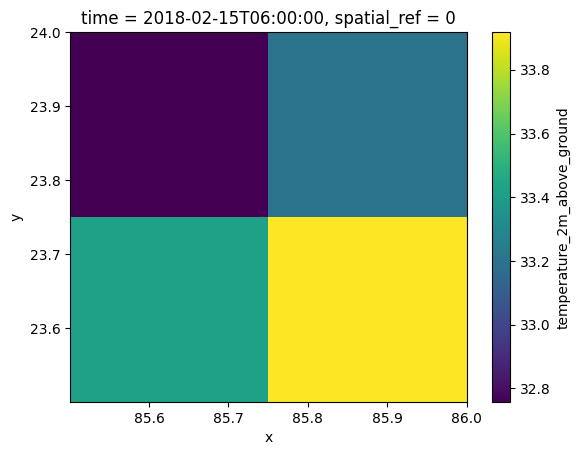

In [ ]:
ds_.temperature_2m_above_ground.plot()

In [ ]:
dataset = ee.ImageCollection('NOAA/GFS0P25').filterBounds(aoi).filter(ee.Filter.eq('creation_time',ee.Date(0).update(2018,2,15,6,0,0).millis())).filter(ee.Filter.eq('forecast_hours',384))
ds = dataset.wx.to_xarray(region=aoi.bounds(), scale=27830)

Requesting data:   0%|          | 0/1 [00:00<?, ?it/s]

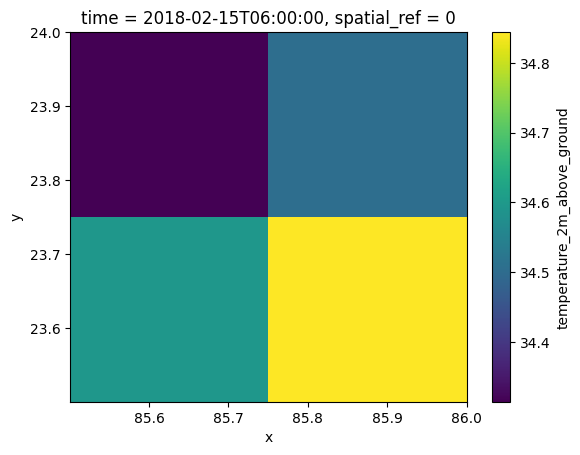

In [ ]:
ds.temperature_2m_above_ground.plot()

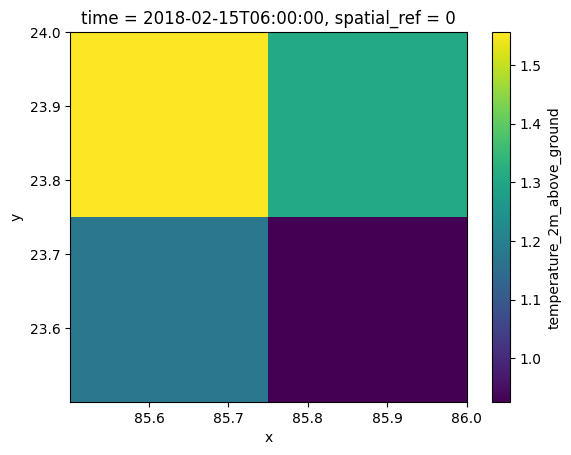

In [ ]:
dds = ds - ds_
dds.temperature_2m_above_ground.plot()

In [ ]:
# Start date is 2021-09-01
# Start date is 2021-08-15

In [ ]:
# for i in range(0,120):
#     print(i)
import datetime as dt
import xarray as xr

In [ ]:
# 360, 363, 366, 369, 372, 375, 378, 381, 384

dataset = ee.ImageCollection('NOAA/GFS0P25').filterBounds(aoi).filter(ee.Filter.eq('creation_time',ee.Date(0).update(2021,9,1,0,0,0).millis())).filter(ee.Filter.eq('forecast_hours',3))
ds_gfs = dataset.wx.to_xarray(region=aoi.bounds(), scale=27830)
if 'time' in ds_gfs.variables:
    ds_gfs = ds_gfs.drop_vars('time')

# Now you can assign datetime values to the 'time' dimension
time_values = [dt.datetime(2021, 9, 1) + dt.timedelta(hours = 3)]  # your datetime values
ds_gfs = ds_gfs.assign_coords(time=time_values)

for forecast_hr in range(6,384, 3):
    print(forecast_hr)
    dataset = ee.ImageCollection('NOAA/GFS0P25').filterBounds(aoi).filter(ee.Filter.eq('creation_time',ee.Date(0).update(2019,9,1,0,0,0).millis())).filter(ee.Filter.eq('forecast_hours',forecast_hr))
    ds_gfs_ = dataset.wx.to_xarray(region=aoi.bounds(), scale=27830)
    if 'time' in ds_gfs_.variables:
        ds_gfs_ = ds_gfs_.drop_vars('time')

    # Now you can assign datetime values to the 'time' dimension
    time_values = [dt.datetime(2021, 9, 1) + dt.timedelta(hours = forecast_hr)]  # your datetime values
    ds_gfs_ = ds_gfs_.assign_coords(time=time_values)
    ds_gfs = xr.concat([ds_gfs, ds_gfs_], dim='time')

Requesting data:   0%|          | 0/1 [00:00<?, ?it/s]

6


Requesting data:   0%|          | 0/1 [00:00<?, ?it/s]

9


Requesting data:   0%|          | 0/1 [00:00<?, ?it/s]

12


Requesting data:   0%|          | 0/1 [00:00<?, ?it/s]

15


Requesting data:   0%|          | 0/1 [00:00<?, ?it/s]

18


Requesting data:   0%|          | 0/1 [00:00<?, ?it/s]

21


Requesting data:   0%|          | 0/1 [00:00<?, ?it/s]

24


Requesting data:   0%|          | 0/1 [00:00<?, ?it/s]

27


Requesting data:   0%|          | 0/1 [00:00<?, ?it/s]

30


Requesting data:   0%|          | 0/1 [00:00<?, ?it/s]

33


Requesting data:   0%|          | 0/1 [00:00<?, ?it/s]

36


Requesting data:   0%|          | 0/1 [00:00<?, ?it/s]

39


Requesting data:   0%|          | 0/1 [00:00<?, ?it/s]

42


Requesting data:   0%|          | 0/1 [00:00<?, ?it/s]

45


Requesting data:   0%|          | 0/1 [00:00<?, ?it/s]

48


Requesting data:   0%|          | 0/1 [00:00<?, ?it/s]

51


Requesting data:   0%|          | 0/1 [00:00<?, ?it/s]

54


Requesting data:   0%|          | 0/1 [00:00<?, ?it/s]

57


Requesting data:   0%|          | 0/1 [00:00<?, ?it/s]

60


Requesting data:   0%|          | 0/1 [00:00<?, ?it/s]

63


Requesting data:   0%|          | 0/1 [00:00<?, ?it/s]

66


Requesting data:   0%|          | 0/1 [00:00<?, ?it/s]

69


Requesting data:   0%|          | 0/1 [00:00<?, ?it/s]

72


Requesting data:   0%|          | 0/1 [00:00<?, ?it/s]

75


Requesting data:   0%|          | 0/1 [00:00<?, ?it/s]

78


Requesting data:   0%|          | 0/1 [00:00<?, ?it/s]

81


Requesting data:   0%|          | 0/1 [00:00<?, ?it/s]

84


Requesting data:   0%|          | 0/1 [00:00<?, ?it/s]

87


Requesting data:   0%|          | 0/1 [00:00<?, ?it/s]

90


Requesting data:   0%|          | 0/1 [00:00<?, ?it/s]

93


Requesting data:   0%|          | 0/1 [00:00<?, ?it/s]

96


Requesting data:   0%|          | 0/1 [00:00<?, ?it/s]

99


Requesting data:   0%|          | 0/1 [00:00<?, ?it/s]

102


Requesting data:   0%|          | 0/1 [00:00<?, ?it/s]

105


Requesting data:   0%|          | 0/1 [00:00<?, ?it/s]

108


Requesting data:   0%|          | 0/1 [00:00<?, ?it/s]

111


Requesting data:   0%|          | 0/1 [00:00<?, ?it/s]

114


Requesting data:   0%|          | 0/1 [00:00<?, ?it/s]

117


Requesting data:   0%|          | 0/1 [00:00<?, ?it/s]

120


Requesting data:   0%|          | 0/1 [00:00<?, ?it/s]

123


Requesting data:   0%|          | 0/1 [00:00<?, ?it/s]

126


Requesting data:   0%|          | 0/1 [00:00<?, ?it/s]

129


Requesting data:   0%|          | 0/1 [00:00<?, ?it/s]

132


Requesting data:   0%|          | 0/1 [00:00<?, ?it/s]

135


Requesting data:   0%|          | 0/1 [00:00<?, ?it/s]

138


Requesting data:   0%|          | 0/1 [00:00<?, ?it/s]

141


Requesting data:   0%|          | 0/1 [00:00<?, ?it/s]

144


Requesting data:   0%|          | 0/1 [00:00<?, ?it/s]

147


Requesting data:   0%|          | 0/1 [00:00<?, ?it/s]

150


Requesting data:   0%|          | 0/1 [00:00<?, ?it/s]

153


Requesting data:   0%|          | 0/1 [00:00<?, ?it/s]

156


Requesting data:   0%|          | 0/1 [00:00<?, ?it/s]

159


Requesting data:   0%|          | 0/1 [00:00<?, ?it/s]

162


Requesting data:   0%|          | 0/1 [00:00<?, ?it/s]

165


Requesting data:   0%|          | 0/1 [00:00<?, ?it/s]

168


Requesting data:   0%|          | 0/1 [00:00<?, ?it/s]

171


Requesting data:   0%|          | 0/1 [00:00<?, ?it/s]

174


Requesting data:   0%|          | 0/1 [00:00<?, ?it/s]

177


Requesting data:   0%|          | 0/1 [00:00<?, ?it/s]

180


Requesting data:   0%|          | 0/1 [00:00<?, ?it/s]

183


Requesting data:   0%|          | 0/1 [00:00<?, ?it/s]

186


Requesting data:   0%|          | 0/1 [00:00<?, ?it/s]

189


Requesting data:   0%|          | 0/1 [00:00<?, ?it/s]

192


Requesting data:   0%|          | 0/1 [00:00<?, ?it/s]

195


Requesting data:   0%|          | 0/1 [00:00<?, ?it/s]

198


Requesting data:   0%|          | 0/1 [00:00<?, ?it/s]

201


Requesting data:   0%|          | 0/1 [00:00<?, ?it/s]

204


Requesting data:   0%|          | 0/1 [00:00<?, ?it/s]

207


Requesting data:   0%|          | 0/1 [00:00<?, ?it/s]

210


Requesting data:   0%|          | 0/1 [00:00<?, ?it/s]

213


Requesting data:   0%|          | 0/1 [00:00<?, ?it/s]

216


Requesting data:   0%|          | 0/1 [00:00<?, ?it/s]

219


Requesting data:   0%|          | 0/1 [00:00<?, ?it/s]

222


Requesting data:   0%|          | 0/1 [00:00<?, ?it/s]

225


Requesting data:   0%|          | 0/1 [00:00<?, ?it/s]

228


Requesting data:   0%|          | 0/1 [00:00<?, ?it/s]

231


Requesting data:   0%|          | 0/1 [00:00<?, ?it/s]

234


Requesting data:   0%|          | 0/1 [00:00<?, ?it/s]

237


Requesting data:   0%|          | 0/1 [00:00<?, ?it/s]

240


Requesting data:   0%|          | 0/1 [00:00<?, ?it/s]

243


Requesting data:   0%|          | 0/1 [00:00<?, ?it/s]

246


Requesting data:   0%|          | 0/1 [00:00<?, ?it/s]

249


Requesting data:   0%|          | 0/1 [00:00<?, ?it/s]

252


Requesting data:   0%|          | 0/1 [00:00<?, ?it/s]

255


Requesting data:   0%|          | 0/1 [00:00<?, ?it/s]

258


Requesting data:   0%|          | 0/1 [00:00<?, ?it/s]

261


Requesting data:   0%|          | 0/1 [00:00<?, ?it/s]

264


Requesting data:   0%|          | 0/1 [00:00<?, ?it/s]

267


Requesting data:   0%|          | 0/1 [00:00<?, ?it/s]

270


Requesting data:   0%|          | 0/1 [00:00<?, ?it/s]

273


Requesting data:   0%|          | 0/1 [00:00<?, ?it/s]

276


Requesting data:   0%|          | 0/1 [00:00<?, ?it/s]

279


Requesting data:   0%|          | 0/1 [00:00<?, ?it/s]

282


Requesting data:   0%|          | 0/1 [00:00<?, ?it/s]

285


Requesting data:   0%|          | 0/1 [00:00<?, ?it/s]

288


Requesting data:   0%|          | 0/1 [00:00<?, ?it/s]

291


Requesting data:   0%|          | 0/1 [00:00<?, ?it/s]

294


Requesting data:   0%|          | 0/1 [00:00<?, ?it/s]

297


Requesting data:   0%|          | 0/1 [00:00<?, ?it/s]

300


Requesting data:   0%|          | 0/1 [00:00<?, ?it/s]

303


Requesting data:   0%|          | 0/1 [00:00<?, ?it/s]

306


Requesting data:   0%|          | 0/1 [00:00<?, ?it/s]

309


Requesting data:   0%|          | 0/1 [00:00<?, ?it/s]

312


Requesting data:   0%|          | 0/1 [00:00<?, ?it/s]

315


Requesting data:   0%|          | 0/1 [00:00<?, ?it/s]

318


Requesting data:   0%|          | 0/1 [00:00<?, ?it/s]

321


Requesting data:   0%|          | 0/1 [00:00<?, ?it/s]

324


Requesting data:   0%|          | 0/1 [00:00<?, ?it/s]

327


Requesting data:   0%|          | 0/1 [00:00<?, ?it/s]

330


Requesting data:   0%|          | 0/1 [00:00<?, ?it/s]

333


Requesting data:   0%|          | 0/1 [00:00<?, ?it/s]

336


Requesting data:   0%|          | 0/1 [00:00<?, ?it/s]

339


Requesting data:   0%|          | 0/1 [00:00<?, ?it/s]

342


Requesting data:   0%|          | 0/1 [00:00<?, ?it/s]

345


Requesting data:   0%|          | 0/1 [00:00<?, ?it/s]

348


Requesting data:   0%|          | 0/1 [00:00<?, ?it/s]

351


Requesting data:   0%|          | 0/1 [00:00<?, ?it/s]

354


Requesting data:   0%|          | 0/1 [00:00<?, ?it/s]

357


Requesting data:   0%|          | 0/1 [00:00<?, ?it/s]

360


Requesting data:   0%|          | 0/1 [00:00<?, ?it/s]

363


Requesting data:   0%|          | 0/1 [00:00<?, ?it/s]

366


Requesting data:   0%|          | 0/1 [00:00<?, ?it/s]

369


Requesting data:   0%|          | 0/1 [00:00<?, ?it/s]

372


Requesting data:   0%|          | 0/1 [00:00<?, ?it/s]

375


Requesting data:   0%|          | 0/1 [00:00<?, ?it/s]

378


Requesting data:   0%|          | 0/1 [00:00<?, ?it/s]

381


Requesting data:   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
import matplotlib.pyplot as plt

Text(0.5, 0, 'Forecast time')

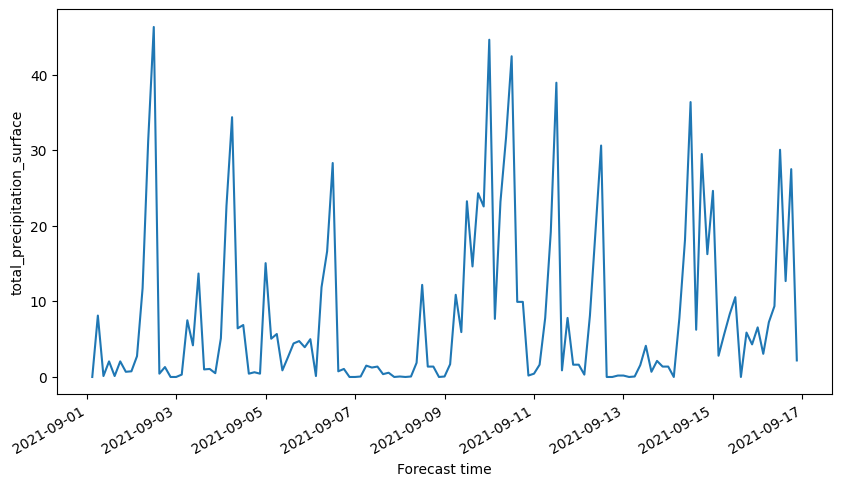

In [ ]:
fig,ax = plt.subplots(ncols=1,nrows=1, figsize=(10,5))
ds_gfs.total_precipitation_surface.sum(dim='x').sum(dim='y').plot(ax=ax)
ax.set_xlabel('Forecast time')

In [ ]:
ds_gfs

<xarray.Dataset>
Dimensions:                               (y: 2, x: 2, time: 127)
Coordinates:
  * y                                     (y) float64 23.88 23.63
  * x                                     (x) float64 85.63 85.88
  * time                                  (time) datetime64[ns] 2021-09-01T03...
Data variables:
    temperature_2m_above_ground           (time, y, x) float64 27.96 ... 25.55
    specific_humidity_2m_above_ground     (time, y, x) float64 0.01777 ... 0....
    relative_humidity_2m_above_ground     (time, y, x) float64 72.2 ... 88.9
    u_component_of_wind_10m_above_ground  (time, y, x) float64 0.4546 ... 1.645
    v_component_of_wind_10m_above_ground  (time, y, x) float64 2.084 ... 0.2927
    total_precipitation_surface           (time, y, x) float64 0.0 ... 0.0625
    precipitable_water_entire_atmosphere  (time, y, x) float64 54.05 ... 62.6
    total_cloud_cover_entire_atmosphere   (time, y, x) float64 10.7 ... 100.0
    downward_shortwave_radiation_flux     (time, y, x) float64 266.0 ... 0.0
Attributes:
    transform:               (0.2500011435704628, 0.0, 85.50039110109829, 0.0...
    crs:                     +init=epsg:4326
    res:                     (0.2500011435704628, 0.2500011435704628)
    is_tiled:                1
    nodatavals:              (-32768.0,)
    scales:                  (1.0,)
    offsets:                 (0.0,)
    AREA_OR_POINT:           Area
    TIFFTAG_RESOLUTIONUNIT:  1 (unitless)
    TIFFTAG_XRESOLUTION:     1
    TIFFTAG_YRESOLUTION:     1

In [ ]:
ds_gfs_

<xarray.Dataset>
Dimensions:                               (y: 2, x: 2, time: 1)
Coordinates:
  * y                                     (y) float64 23.88 23.63
  * x                                     (x) float64 85.63 85.88
  * time                                  (time) datetime64[ns] 2021-09-16T21...
Data variables:
    temperature_2m_above_ground           (time, y, x) float64 24.95 ... 25.55
    specific_humidity_2m_above_ground     (time, y, x) float64 0.01875 ... 0....
    relative_humidity_2m_above_ground     (time, y, x) float64 89.9 ... 88.9
    u_component_of_wind_10m_above_ground  (time, y, x) float64 0.7147 ... 1.645
    v_component_of_wind_10m_above_ground  (time, y, x) float64 -0.6173 ... 0....
    total_precipitation_surface           (time, y, x) float64 1.125 ... 0.0625
    precipitable_water_entire_atmosphere  (time, y, x) float64 60.0 ... 62.6
    total_cloud_cover_entire_atmosphere   (time, y, x) float64 100.0 ... 100.0
    downward_shortwave_radiation_flux     (time, y, x) float64 0.0 0.0 0.0 0.0
Attributes:
    transform:               (0.2500011435704628, 0.0, 85.50039110109829, 0.0...
    crs:                     +init=epsg:4326
    res:                     (0.2500011435704628, 0.2500011435704628)
    is_tiled:                1
    nodatavals:              (-32768.0,)
    scales:                  (1.0,)
    offsets:                 (0.0,)
    AREA_OR_POINT:           Area
    TIFFTAG_RESOLUTIONUNIT:  1 (unitless)
    TIFFTAG_XRESOLUTION:     1
    TIFFTAG_YRESOLUTION:     1

Text(0.5, 0, 'Forecast time')

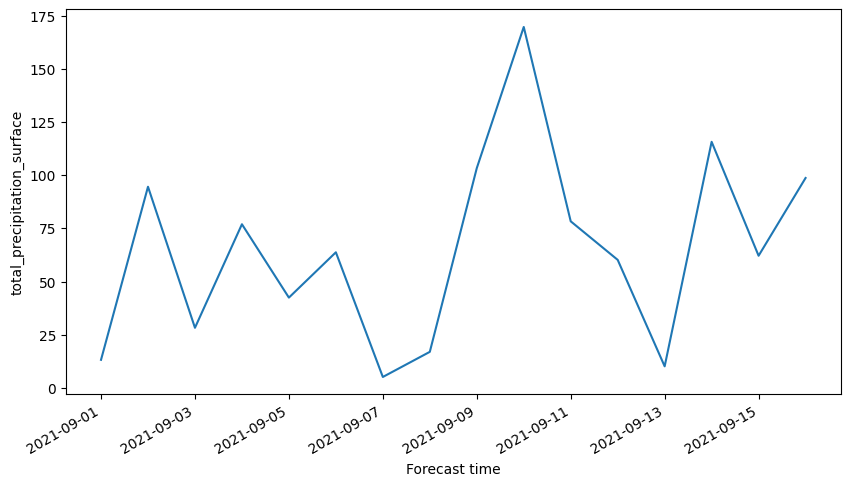

In [ ]:
ds_gfs_day = ds_gfs.resample(time='1D').sum()
fig,ax = plt.subplots(ncols=1,nrows=1, figsize=(10,5))
ds_gfs_day.total_precipitation_surface.sum(dim='x').sum(dim='y').plot(ax=ax)
ax.set_xlabel('Forecast time')

In [ ]:
# 360, 363, 366, 369, 372, 375, 378, 381, 384

dataset = ee.ImageCollection('NOAA/GFS0P25').filterBounds(aoi).filter(ee.Filter.eq('creation_time',ee.Date(0).update(2021,9,1,0,0,0).millis())).filter(ee.Filter.eq('forecast_hours',3))
ds_gfs = dataset.wx.to_xarray(region=aoi.bounds(), scale=27830)
if 'time' in ds_gfs.variables:
    ds_gfs = ds_gfs.drop_vars('time')

# Now you can assign datetime values to the 'time' dimension
time_values = [dt.datetime(2021, 9, 1) + dt.timedelta(hours = 3)]  # your datetime values
ds_gfs = ds_gfs.assign_coords(time=time_values)

for forecast_hr in range(6,120, 1):
    print(forecast_hr)
    dataset = ee.ImageCollection('NOAA/GFS0P25').filterBounds(aoi).filter(ee.Filter.eq('creation_time',ee.Date(0).update(2019,9,1,0,0,0).millis())).filter(ee.Filter.eq('forecast_hours',forecast_hr))
    ds_gfs_ = dataset.wx.to_xarray(region=aoi.bounds(), scale=27830)
    if 'time' in ds_gfs_.variables:
        ds_ = ds_gfs_.drop_vars('time')

    # Now you can assign datetime values to the 'time' dimension
    time_values = [dt.datetime(2021, 9, 1) + dt.timedelta(hours = forecast_hr)]  # your datetime values
    ds_gfs_ = ds_gfs_.assign_coords(time=time_values)
    ds_gfs = xr.concat([ds_gfs, ds_gfs_], dim='time')

Requesting data:   0%|          | 0/1 [00:00<?, ?it/s]

6


Requesting data:   0%|          | 0/1 [00:00<?, ?it/s]

7


Requesting data:   0%|          | 0/1 [00:00<?, ?it/s]

8


Requesting data:   0%|          | 0/1 [00:00<?, ?it/s]

9


Requesting data:   0%|          | 0/1 [00:00<?, ?it/s]

10


Requesting data:   0%|          | 0/1 [00:00<?, ?it/s]

11


Requesting data:   0%|          | 0/1 [00:00<?, ?it/s]

12


Requesting data:   0%|          | 0/1 [00:00<?, ?it/s]

13


Requesting data:   0%|          | 0/1 [00:00<?, ?it/s]

14


Requesting data:   0%|          | 0/1 [00:00<?, ?it/s]

15


Requesting data:   0%|          | 0/1 [00:00<?, ?it/s]

16


Requesting data:   0%|          | 0/1 [00:00<?, ?it/s]

17


Requesting data:   0%|          | 0/1 [00:00<?, ?it/s]

18


Requesting data:   0%|          | 0/1 [00:00<?, ?it/s]

19


Requesting data:   0%|          | 0/1 [00:00<?, ?it/s]

20


Requesting data:   0%|          | 0/1 [00:00<?, ?it/s]

21


Requesting data:   0%|          | 0/1 [00:00<?, ?it/s]

22


Requesting data:   0%|          | 0/1 [00:00<?, ?it/s]

23


Requesting data:   0%|          | 0/1 [00:00<?, ?it/s]

24


Requesting data:   0%|          | 0/1 [00:00<?, ?it/s]

25


Requesting data:   0%|          | 0/1 [00:00<?, ?it/s]

26


Requesting data:   0%|          | 0/1 [00:00<?, ?it/s]

27


Requesting data:   0%|          | 0/1 [00:00<?, ?it/s]

28


Requesting data:   0%|          | 0/1 [00:00<?, ?it/s]

29


Requesting data:   0%|          | 0/1 [00:00<?, ?it/s]

30


Requesting data:   0%|          | 0/1 [00:00<?, ?it/s]

31


Requesting data:   0%|          | 0/1 [00:00<?, ?it/s]

32


Requesting data:   0%|          | 0/1 [00:00<?, ?it/s]

33


Requesting data:   0%|          | 0/1 [00:00<?, ?it/s]

34


Requesting data:   0%|          | 0/1 [00:00<?, ?it/s]

35


Requesting data:   0%|          | 0/1 [00:00<?, ?it/s]

36


Requesting data:   0%|          | 0/1 [00:00<?, ?it/s]

37


Requesting data:   0%|          | 0/1 [00:00<?, ?it/s]

38


Requesting data:   0%|          | 0/1 [00:00<?, ?it/s]

39


Requesting data:   0%|          | 0/1 [00:00<?, ?it/s]

40


Requesting data:   0%|          | 0/1 [00:00<?, ?it/s]

41


Requesting data:   0%|          | 0/1 [00:00<?, ?it/s]

42


Requesting data:   0%|          | 0/1 [00:00<?, ?it/s]

43


Requesting data:   0%|          | 0/1 [00:00<?, ?it/s]

44


Requesting data:   0%|          | 0/1 [00:00<?, ?it/s]

45


Requesting data:   0%|          | 0/1 [00:00<?, ?it/s]

46


Requesting data:   0%|          | 0/1 [00:00<?, ?it/s]

47


Requesting data:   0%|          | 0/1 [00:00<?, ?it/s]

48


Requesting data:   0%|          | 0/1 [00:00<?, ?it/s]

49


Requesting data:   0%|          | 0/1 [00:00<?, ?it/s]

50


Requesting data:   0%|          | 0/1 [00:00<?, ?it/s]

51


Requesting data:   0%|          | 0/1 [00:00<?, ?it/s]

52


Requesting data:   0%|          | 0/1 [00:00<?, ?it/s]

53


Requesting data:   0%|          | 0/1 [00:00<?, ?it/s]

54


Requesting data:   0%|          | 0/1 [00:00<?, ?it/s]

55


Requesting data:   0%|          | 0/1 [00:00<?, ?it/s]

56


Requesting data:   0%|          | 0/1 [00:00<?, ?it/s]

57


Requesting data:   0%|          | 0/1 [00:00<?, ?it/s]

58


Requesting data:   0%|          | 0/1 [00:00<?, ?it/s]

59


Requesting data:   0%|          | 0/1 [00:00<?, ?it/s]

60


Requesting data:   0%|          | 0/1 [00:00<?, ?it/s]

61


Requesting data:   0%|          | 0/1 [00:00<?, ?it/s]

62


Requesting data:   0%|          | 0/1 [00:00<?, ?it/s]

63


Requesting data:   0%|          | 0/1 [00:00<?, ?it/s]

64


Requesting data:   0%|          | 0/1 [00:00<?, ?it/s]

65


Requesting data:   0%|          | 0/1 [00:00<?, ?it/s]

66


Requesting data:   0%|          | 0/1 [00:00<?, ?it/s]

67


Requesting data:   0%|          | 0/1 [00:00<?, ?it/s]

68


Requesting data:   0%|          | 0/1 [00:00<?, ?it/s]

69


Requesting data:   0%|          | 0/1 [00:00<?, ?it/s]

70


Requesting data:   0%|          | 0/1 [00:00<?, ?it/s]

71


Requesting data:   0%|          | 0/1 [00:00<?, ?it/s]

72


Requesting data:   0%|          | 0/1 [00:00<?, ?it/s]

73


Requesting data:   0%|          | 0/1 [00:00<?, ?it/s]

74


Requesting data:   0%|          | 0/1 [00:00<?, ?it/s]

75


Requesting data:   0%|          | 0/1 [00:00<?, ?it/s]

76


Requesting data:   0%|          | 0/1 [00:00<?, ?it/s]

77


Requesting data:   0%|          | 0/1 [00:00<?, ?it/s]

78


Requesting data:   0%|          | 0/1 [00:00<?, ?it/s]

79


Requesting data:   0%|          | 0/1 [00:00<?, ?it/s]

80


Requesting data:   0%|          | 0/1 [00:00<?, ?it/s]

81


Requesting data:   0%|          | 0/1 [00:00<?, ?it/s]

82


Requesting data:   0%|          | 0/1 [00:00<?, ?it/s]

83


Requesting data:   0%|          | 0/1 [00:00<?, ?it/s]

84


Requesting data:   0%|          | 0/1 [00:00<?, ?it/s]

85


Requesting data:   0%|          | 0/1 [00:00<?, ?it/s]

86


Requesting data:   0%|          | 0/1 [00:00<?, ?it/s]

87


Requesting data:   0%|          | 0/1 [00:00<?, ?it/s]

88


Requesting data:   0%|          | 0/1 [00:00<?, ?it/s]

89


Requesting data:   0%|          | 0/1 [00:00<?, ?it/s]

90


Requesting data:   0%|          | 0/1 [00:00<?, ?it/s]

91


Requesting data:   0%|          | 0/1 [00:00<?, ?it/s]

92


Requesting data:   0%|          | 0/1 [00:00<?, ?it/s]

93


Requesting data:   0%|          | 0/1 [00:00<?, ?it/s]

94


Requesting data:   0%|          | 0/1 [00:00<?, ?it/s]

95


Requesting data:   0%|          | 0/1 [00:00<?, ?it/s]

96


Requesting data:   0%|          | 0/1 [00:00<?, ?it/s]

97


Requesting data:   0%|          | 0/1 [00:00<?, ?it/s]

98


Requesting data:   0%|          | 0/1 [00:00<?, ?it/s]

99


Requesting data:   0%|          | 0/1 [00:00<?, ?it/s]

100


Requesting data:   0%|          | 0/1 [00:00<?, ?it/s]

101


Requesting data:   0%|          | 0/1 [00:00<?, ?it/s]

102


Requesting data:   0%|          | 0/1 [00:00<?, ?it/s]

103


Requesting data:   0%|          | 0/1 [00:00<?, ?it/s]

104


Requesting data:   0%|          | 0/1 [00:00<?, ?it/s]

105


Requesting data:   0%|          | 0/1 [00:00<?, ?it/s]

106


Requesting data:   0%|          | 0/1 [00:00<?, ?it/s]

107


Requesting data:   0%|          | 0/1 [00:00<?, ?it/s]

108


Requesting data:   0%|          | 0/1 [00:00<?, ?it/s]

109


Requesting data:   0%|          | 0/1 [00:00<?, ?it/s]

110


Requesting data:   0%|          | 0/1 [00:00<?, ?it/s]

111


Requesting data:   0%|          | 0/1 [00:00<?, ?it/s]

112


Requesting data:   0%|          | 0/1 [00:00<?, ?it/s]

113


Requesting data:   0%|          | 0/1 [00:00<?, ?it/s]

114


Requesting data:   0%|          | 0/1 [00:00<?, ?it/s]

115


Requesting data:   0%|          | 0/1 [00:00<?, ?it/s]

116


Requesting data:   0%|          | 0/1 [00:00<?, ?it/s]

117


Requesting data:   0%|          | 0/1 [00:00<?, ?it/s]

118


Requesting data:   0%|          | 0/1 [00:00<?, ?it/s]

119


Requesting data:   0%|          | 0/1 [00:00<?, ?it/s]

Text(0.5, 0, 'Forecast time')

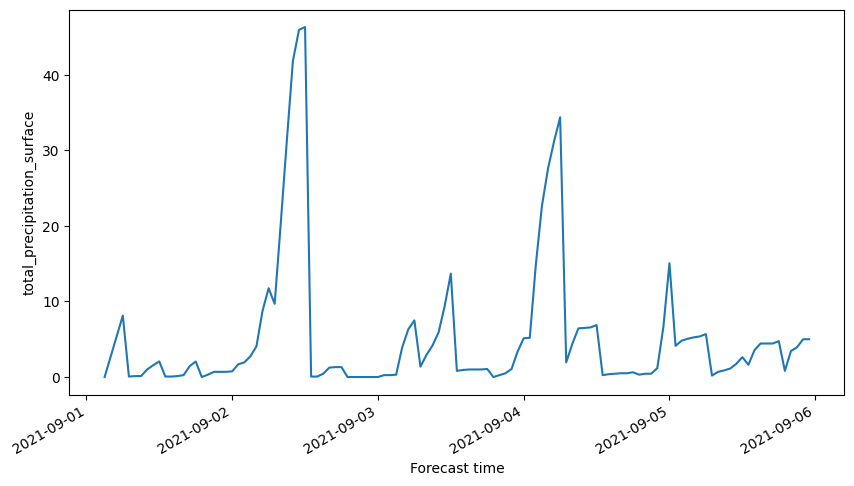

In [ ]:
fig,ax = plt.subplots(ncols=1,nrows=1, figsize=(10,5))
ds.total_precipitation_surface.sum(dim='x').sum(dim='y').plot(ax=ax)
ax.set_xlabel('Forecast time')

A dt of 3 hrs is okay, lets just check how good is this forecast

In [ ]:
!!wget https://data.chc.ucsb.edu/products/CHIRPS-2.0/global_daily/netcdf/p05/chirps-v2.0.2021.days_p05.nc

['--2023-04-08 18:15:42--  https://data.chc.ucsb.edu/products/CHIRPS-2.0/global_daily/netcdf/p05/chirps-v2.0.2021.days_p05.nc',
 'Resolving data.chc.ucsb.edu (data.chc.ucsb.edu)... 128.111.100.31',
 'Connecting to data.chc.ucsb.edu (data.chc.ucsb.edu)|128.111.100.31|:443... connected.',
 'HTTP request sent, awaiting response... 200 OK',
 'Length: 1129741271 (1.1G) [application/x-netcdf]',
 'Saving to: ‘chirps-v2.0.2021.days_p05.nc’',
 '',
 '',
 '          chirps-v2   0%[                    ]       0  --.-KB/s               ',
 '         chirps-v2.   0%[                    ] 195.19K   768KB/s               ',
 '        chirps-v2.0   0%[                    ]   3.20M  6.29MB/s               ',
 '       chirps-v2.0.   1%[                    ]  11.95M  16.8MB/s               ',
 '      chirps-v2.0.2   1%[                    ]  20.26M  22.3MB/s               ',
 '     chirps-v2.0.20   2%[                    ]  28.30M  25.5MB/s               ',
 '    chirps-v2.0.202   3%[                    ]

In [ ]:
coords

[[85.70079380054237, 23.664249890518466],
 [85.90608752342824, 23.664249890518466],
 [85.90608752342824, 23.79048835291618],
 [85.83765628246628, 23.79048835291618],
 [85.70079380054237, 23.664249890518466]]

In [ ]:
coords[2][0]

85.90608752342824

In [ ]:
import xarray as xr
ds_chirps = xr.open_dataset('chirps-v2.0.2021.days_p05.nc').sel(latitude=slice(coords[0][1], coords[2][1])).sel(longitude=slice(coords[0][0], coords[2][0])).sel(time=slice('2021-09-01', '2021-09-17'))
ds_chirps

<xarray.Dataset>
Dimensions:    (latitude: 3, longitude: 4, time: 17)
Coordinates:
  * latitude   (latitude) float32 23.67 23.72 23.77
  * longitude  (longitude) float32 85.73 85.77 85.83 85.88
  * time       (time) datetime64[ns] 2021-09-01 2021-09-02 ... 2021-09-17
Data variables:
    precip     (time, latitude, longitude) float32 ...
Attributes: (12/15)
    Conventions:       CF-1.6
    title:             CHIRPS Version 2.0
    history:           created by Climate Hazards Group
    version:           Version 2.0
    date_created:      2022-01-18
    creator_name:      Pete Peterson
    ...                ...
    reference:         Funk, C.C., Peterson, P.J., Landsfeld, M.F., Pedreros,...
    comments:           time variable denotes the first day of the given day....
    acknowledgements:  The Climate Hazards Group InfraRed Precipitation with ...
    ftp_url:           ftp://chg-ftpout.geog.ucsb.edu/pub/org/chg/products/CH...
    website:           http://chg.geog.ucsb.edu/data/chirps/index.html
    faq:               http://chg-wiki.geog.ucsb.edu/wiki/CHIRPS_FAQ

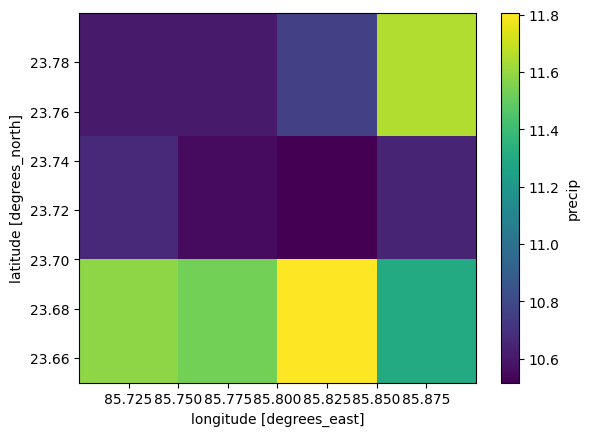

In [ ]:
ds_chirps.precip.mean(dim='time').plot()

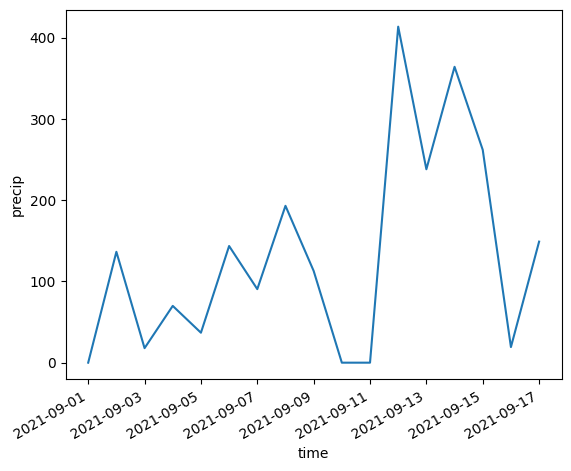

In [ ]:
ds_chirps.precip.sum(dim='latitude').sum('longitude').plot()

# Tabular data for prediction

In [111]:
ds_sentinel

<xarray.Dataset> Size: 13MB
Dimensions:      (time: 1, x: 399, y: 183)
Coordinates:
  * time         (time) datetime64[ns] 8B 1970-01-01
  * x            (x) float64 3kB 73.69 73.69 73.69 73.69 ... 73.79 73.79 73.79
  * y            (y) float64 1kB 18.45 18.45 18.45 18.45 ... 18.4 18.4 18.4 18.4
    spatial_ref  int64 8B 0
Data variables: (12/23)
    B1           (time, y, x) float64 584kB ...
    B2           (time, y, x) float64 584kB ...
    B3           (time, y, x) float64 584kB ...
    B4           (time, y, x) float64 584kB ...
    B5           (time, y, x) float64 584kB ...
    B6           (time, y, x) float64 584kB ...
    ...           ...
    TCI_B        (time, y, x) float64 584kB ...
    MSK_CLDPRB   (time, y, x) float64 584kB ...
    MSK_SNWPRB   (time, y, x) float64 584kB ...
    QA10         (time, y, x) float64 584kB ...
    QA20         (time, y, x) float64 584kB ...
    QA60         (time, y, x) float64 584kB ...
Attributes:
    AREA_OR_POINT:           Area
    TIFFTAG_RESOLUTIONUNIT:  1 (unitless)
    TIFFTAG_XRESOLUTION:     1
    TIFFTAG_YRESOLUTION:     1
    _FillValue:              -32768.0
    scale_factor:            1.0
    add_offset:              0.0

In [112]:
ds_landsat_ = ds_landsat.mean(dim='time').interp(y=ds_sentinel.y.values).interp(x=ds_sentinel.x.values)

In [113]:
ds_ndwi_ = ds_ndwi.mean(dim='time').interp(y=ds_sentinel.y.values).interp(x=ds_sentinel.x.values)

In [114]:
ds_ndwi

<xarray.Dataset> Size: 26MB
Dimensions:      (time: 43, x: 399, y: 183)
Coordinates:
  * time         (time) datetime64[ns] 344B 2023-01-04T05:43:54 ... 2023-12-3...
  * x            (x) float64 3kB 73.69 73.69 73.69 73.69 ... 73.79 73.79 73.79
  * y            (y) float64 1kB 18.45 18.45 18.45 18.45 ... 18.4 18.4 18.4 18.4
    spatial_ref  int64 8B 0
Data variables:
    water        (time, y, x) float64 25MB 0.02466 0.02475 ... 0.03322 0.03306
    water_mask   (y, x) float64 584kB 0.0 0.0 0.0 0.0 0.0 ... 0.0 0.0 0.0 0.0
    NDWI_        (y, x) float64 584kB 0.0 0.0 0.0 0.0 0.0 ... 0.0 0.0 0.0 0.0
Attributes:
    TIFFTAG_XRESOLUTION:     1
    TIFFTAG_YRESOLUTION:     1
    TIFFTAG_RESOLUTIONUNIT:  1 (unitless)
    AREA_OR_POINT:           Area
    _FillValue:              -32768.0
    scale_factor:            1.0
    add_offset:              0.0

In [115]:
ds_landsat_

<xarray.Dataset> Size: 11MB
Dimensions:        (y: 183, x: 399)
Coordinates:
    spatial_ref    int64 8B 0
  * y              (y) float64 1kB 18.45 18.45 18.45 18.45 ... 18.4 18.4 18.4
  * x              (x) float64 3kB 73.69 73.69 73.69 73.69 ... 73.79 73.79 73.79
Data variables: (12/19)
    SR_B1          (y, x) float64 584kB 0.1357 0.1151 0.1069 ... 0.03464 0.03431
    SR_B2          (y, x) float64 584kB 0.144 0.1284 0.1156 ... 0.0456 0.0449
    SR_B3          (y, x) float64 584kB 0.1796 0.1654 0.1493 ... 0.07813 0.07647
    SR_B4          (y, x) float64 584kB 0.1832 0.1733 0.1571 ... 0.08178 0.07693
    SR_B5          (y, x) float64 584kB 0.3339 0.3131 0.2961 ... 0.2328 0.2378
    SR_B6          (y, x) float64 584kB 0.2834 0.2856 0.2722 ... 0.2034 0.1982
    ...             ...
    ST_EMSD        (y, x) float64 584kB 167.0 167.0 167.0 ... 163.0 163.0 163.0
    ST_QA          (y, x) float64 584kB 504.0 503.0 502.0 ... 293.5 293.5 294.0
    ST_TRAD        (y, x) float64 584kB 9.352e+03 9.412e+03 ... 9.998e+03
    ST_URAD        (y, x) float64 584kB 3.119e+03 3.138e+03 ... 3.117e+03
    QA_PIXEL       (y, x) float64 584kB 2.205e+04 2.205e+04 ... 2.182e+04
    QA_RADSAT      (y, x) float64 584kB 0.0 0.0 0.0 0.0 0.0 ... 0.0 0.0 0.0 0.0

In [116]:
ds_sentinel.to_netcdf('sentinel_khadakwasla_test_input.nc')
ds_landsat_.to_netcdf('landsat_khadakwasla_test_input.nc')
ds_ndwi_.to_netcdf('ndwi_khadakwasla_test_input.nc')

In [ ]:
!ls

drive
figure.png
kolkata_port_sea_channel_training_sentinel_landsat.csv
landsat_khadakwasla_test_input.nc
ndwi_khadakwasla_test_input.nc
sample_data
sentinel_khadakwasla_test_input.nc


In [117]:
!mv sentinel_khadakwasla_test_input.nc landsat_khadakwasla_test_input.nc ndwi_khadakwasla_test_input.nc /content/drive/MyDrive/Bathy/Training

In [118]:
import xarray as xr
ds_sentinel = xr.open_dataset('/content/drive/MyDrive/Bathy/Training/sentinel_khadakwasla_test_input.nc')
ds_landsat_ = xr.open_dataset('/content/drive/MyDrive/Bathy/Training/landsat_khadakwasla_test_input.nc')
ds_ndwi_ = xr.open_dataset('/content/drive/MyDrive/Bathy/Training/ndwi_khadakwasla_test_input.nc')
df_training = pd.read_csv('/content/drive/MyDrive/Bathy/Training/khadakwasla_sentinel_landsat.csv')

# Training

In [62]:
df_training

,Unnamed: 0,sen_B1,sen_B2,sen_B3,sen_B4,sen_B5,sen_B6,sen_B7,sen_B8,sen_B8A,...,land_B1,land_B2,land_B3,land_B4,land_B5,land_B6,land_B7,bathy,lat,lon
0,0,0.03860,0.05450,0.07020,0.04615,0.04135,0.02265,0.02450,0.02450,0.02475,...,0.016012,0.028167,0.051818,0.034685,0.034987,0.026765,0.019450,5.960833,18.430198,73.764059
1,1,0.03860,0.05675,0.07070,0.04715,0.04305,0.02525,0.02390,0.02390,0.02585,...,0.016920,0.029652,0.052835,0.035345,0.035730,0.027397,0.019863,6.311923,18.430150,73.764154
2,2,0.03900,0.05545,0.07080,0.04695,0.04135,0.02365,0.02500,0.02500,0.02520,...,0.016727,0.029900,0.052945,0.035950,0.036445,0.027617,0.019670,6.679630,18.430124,73.764256
3,3,0.03900,0.05545,0.07080,0.04695,0.04135,0.02365,0.02500,0.02500,0.02520,...,0.016727,0.029900,0.052945,0.035950,0.036445,0.027617,0.019670,7.118108,18.430135,73.764357
4,4,0.03900,0.05545,0.07080,0.04695,0.04135,0.02365,0.02500,0.02500,0.02520,...,0.016727,0.029900,0.052945,0.035950,0.036445,0.027617,0.019670,7.449500,18.430186,73.764439
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1249,1249,0.04395,0.05825,0.07325,0.05050,0.04540,0.03130,0.03160,0.03160,0.03220,...,0.027617,0.038782,0.056960,0.040157,0.044145,0.031990,0.022750,13.320286,18.439868,73.770254
1250,1250,0.04395,0.05825,0.07325,0.05050,0.04540,0.03130,0.03160,0.03160,0.03220,...,0.027617,0.038782,0.056960,0.040157,0.044145,0.031990,0.022750,13.939118,18.439872,73.770354
1251,1251,0.04540,0.05630,0.07265,0.04945,0.04375,0.02895,0.03165,0.03165,0.03375,...,0.027672,0.038040,0.057042,0.039332,0.044145,0.032732,0.023107,14.359412,18.439867,73.770455
1252,1252,0.04540,0.05630,0.07265,0.04945,0.04375,0.02895,0.03165,0.03165,0.03375,...,0.027672,0.038040,0.057042,0.039332,0.044145,0.032732,0.023107,14.112059,18.439854,73.770554


In [63]:
df_training.columns

Index(['Unnamed: 0', 'sen_B1', 'sen_B2', 'sen_B3', 'sen_B4', 'sen_B5',
       'sen_B6', 'sen_B7', 'sen_B8', 'sen_B8A', 'sen_B9', 'sen_B11', 'sen_B12',
       'land_B1', 'land_B2', 'land_B3', 'land_B4', 'land_B5', 'land_B6',
       'land_B7', 'bathy', 'lat', 'lon'],
      dtype='object')

In [64]:
!pip install optuna

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 364.4/364.4 kB 13.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 233.5/233.5 kB 20.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 78.6/78.6 kB 6.9 MB/s eta 0:00:00


In [65]:
!pip install catboost

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 98.7/98.7 MB 22.5 MB/s eta 0:00:00


In [66]:
import optuna

In [67]:
import xgboost as xgb
from catboost import CatBoostRegressor
import numpy as np
import pandas as pd
from sklearn.model_selection import KFold
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import train_test_split

In [68]:
train = df_training.copy()
columns = [col for col in df_training.columns.to_list() if col not in ['lat','lon', 'bathy', 'Unnamed: 0']]
data=train[columns]
target=train['bathy']

In [69]:
data

,sen_B1,sen_B2,sen_B3,sen_B4,sen_B5,sen_B6,sen_B7,sen_B8,sen_B8A,sen_B9,sen_B11,sen_B12,land_B1,land_B2,land_B3,land_B4,land_B5,land_B6,land_B7
0,0.03860,0.05450,0.07020,0.04615,0.04135,0.02265,0.02450,0.02450,0.02475,0.02440,0.03990,0.03975,0.016012,0.028167,0.051818,0.034685,0.034987,0.026765,0.019450
1,0.03860,0.05675,0.07070,0.04715,0.04305,0.02525,0.02390,0.02390,0.02585,0.02445,0.03990,0.03990,0.016920,0.029652,0.052835,0.035345,0.035730,0.027397,0.019863
2,0.03900,0.05545,0.07080,0.04695,0.04135,0.02365,0.02500,0.02500,0.02520,0.02265,0.03985,0.03945,0.016727,0.029900,0.052945,0.035950,0.036445,0.027617,0.019670
3,0.03900,0.05545,0.07080,0.04695,0.04135,0.02365,0.02500,0.02500,0.02520,0.02265,0.03985,0.03945,0.016727,0.029900,0.052945,0.035950,0.036445,0.027617,0.019670
4,0.03900,0.05545,0.07080,0.04695,0.04135,0.02365,0.02500,0.02500,0.02520,0.02265,0.03985,0.03945,0.016727,0.029900,0.052945,0.035950,0.036445,0.027617,0.019670
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1249,0.04395,0.05825,0.07325,0.05050,0.04540,0.03130,0.03160,0.03160,0.03220,0.03235,0.04540,0.04915,0.027617,0.038782,0.056960,0.040157,0.044145,0.031990,0.022750
1250,0.04395,0.05825,0.07325,0.05050,0.04540,0.03130,0.03160,0.03160,0.03220,0.03235,0.04540,0.04915,0.027617,0.038782,0.056960,0.040157,0.044145,0.031990,0.022750
1251,0.04540,0.05630,0.07265,0.04945,0.04375,0.02895,0.03165,0.03165,0.03375,0.03240,0.05275,0.04960,0.027672,0.038040,0.057042,0.039332,0.044145,0.032732,0.023107
1252,0.04540,0.05630,0.07265,0.04945,0.04375,0.02895,0.03165,0.03165,0.03375,0.03240,0.05275,0.04960,0.027672,0.038040,0.057042,0.039332,0.044145,0.032732,0.023107


In [70]:
from sklearn.preprocessing import QuantileTransformer

In [73]:
def objective(trial,data=data,target=target):

    train_x, test_x, train_y, test_y = train_test_split(data, target, test_size=0.15,random_state=42)
    qt = QuantileTransformer(output_distribution='normal', random_state=0)
    train_x = qt.fit_transform(train_x)
    test_x = qt.transform(test_x)

    param = {
        'tree_method':'gpu_hist',  # this parameter means using the GPU when training our model to speedup the training process
        'lambda': trial.suggest_loguniform('lambda', 1e-3, 10.0),
        'alpha': trial.suggest_loguniform('alpha', 1e-3, 10.0),
        'colsample_bytree': trial.suggest_categorical('colsample_bytree', [0.3,0.4,0.5,0.6,0.7,0.8,0.9, 1.0]),
        'subsample': trial.suggest_categorical('subsample', [0.4,0.5,0.6,0.7,0.8,1.0]),
        'learning_rate': trial.suggest_categorical('learning_rate', [0.008,0.01,0.012,0.014,0.016,0.018, 0.02]),
        'n_estimators': 2000,
        'max_depth': trial.suggest_categorical('max_depth', [5,7,9,11,13,15,17]),
        'random_state': trial.suggest_categorical('random_state', [2020]),
        'min_child_weight': trial.suggest_int('min_child_weight', 1, 300),
    }
    model = xgb.XGBRegressor(**param)

    model.fit(train_x,train_y,eval_set=[(test_x,test_y)],verbose=False)

    preds = model.predict(test_x)

    rmse = mean_squared_error(test_y, preds)

    return rmse

In [74]:
study = optuna.create_study(direction='minimize')
study.optimize(objective, n_trials=30)
print('Number of finished trials:', len(study.trials))
print('Best trial:', study.best_trial.params)

[I 2024-12-24 04:42:51,912] A new study created in memory with name: no-name-257dfdad-1521-4246-bdb2-32f0e8b1aa46
[I 2024-12-24 04:42:55,579] Trial 0 finished with value: 7.5089119084363 and parameters: {'lambda': 0.003162674469686807, 'alpha': 0.0010707258973329152, 'colsample_bytree': 0.3, 'subsample': 0.6, 'learning_rate': 0.01, 'max_depth': 13, 'random_state': 2020, 'min_child_weight': 150}. Best is trial 0 with value: 7.5089119084363.
[I 2024-12-24 04:42:58,596] Trial 1 finished with value: 4.530224091290164 and parameters: {'lambda': 0.028850734626786598, 'alpha': 4.811833698772006, 'colsample_bytree': 0.6, 'subsample': 0.6, 'learning_rate': 0.018, 'max_depth': 13, 'random_state': 2020, 'min_child_weight': 111}. Best is trial 1 with value: 4.530224091290164.
[I 2024-12-24 04:43:01,764] Trial 2 finished with value: 5.703973890806666 and parameters: {'lambda': 0.0069128231886858085, 'alpha': 2.00146878952849, 'colsample_bytree': 0.3, 'subsample': 0.7, 'learning_rate': 0.008, 'max_d

Number of finished trials: 30
Best trial: {'lambda': 0.21684417718670165, 'alpha': 0.026421804621412064, 'colsample_bytree': 0.4, 'subsample': 1.0, 'learning_rate': 0.012, 'max_depth': 15, 'random_state': 2020, 'min_child_weight': 5}


In [75]:
study.trials_dataframe()

,number,value,datetime_start,datetime_complete,duration,params_alpha,params_colsample_bytree,params_lambda,params_learning_rate,params_max_depth,params_min_child_weight,params_random_state,params_subsample,state
0,0,7.508912,2024-12-24 04:42:51.915173,2024-12-24 04:42:55.579291,0 days 00:00:03.664118,0.001071,0.3,0.003163,0.010,13,150,2020,0.6,COMPLETE
1,1,4.530224,2024-12-24 04:42:55.580751,2024-12-24 04:42:58.596223,0 days 00:00:03.015472,4.811834,0.6,0.028851,0.018,13,111,2020,0.6,COMPLETE
2,2,5.703974,2024-12-24 04:42:58.598086,2024-12-24 04:43:01.764254,0 days 00:00:03.166168,2.001469,0.3,0.006913,0.008,9,110,2020,0.7,COMPLETE
3,3,10.327093,2024-12-24 04:43:01.765760,2024-12-24 04:43:04.091786,0 days 00:00:02.326026,6.652127,0.6,0.011257,0.018,7,202,2020,0.5,COMPLETE
4,4,4.736816,2024-12-24 04:43:04.093347,2024-12-24 04:43:07.013335,0 days 00:00:02.919988,0.594531,0.5,0.035445,0.018,13,150,2020,0.8,COMPLETE
5,5,4.516528,2024-12-24 04:43:07.015213,2024-12-24 04:43:10.150449,0 days 00:00:03.135236,5.567815,0.6,0.001708,0.010,9,101,2020,0.7,COMPLETE
6,6,7.779691,2024-12-24 04:43:10.151962,2024-12-24 04:43:12.668386,0 days 00:00:02.516424,0.012066,0.8,0.036771,0.020,11,196,2020,0.6,COMPLETE
7,7,7.746388,2024-12-24 04:43:12.669887,2024-12-24 04:43:15.773974,0 days 00:00:03.104087,0.002690,0.3,0.001899,0.016,5,289,2020,1.0,COMPLETE
8,8,4.664645,2024-12-24 04:43:15.775912,2024-12-24 04:43:18.625235,0 days 00:00:02.849323,3.546983,1.0,0.086583,0.010,17,99,2020,0.6,COMPLETE
9,9,13.130089,2024-12-24 04:43:18.626622,2024-12-24 04:43:20.590086,0 days 00:00:01.963464,0.016657,0.5,0.033294,0.016,15,300,2020,0.5,COMPLETE


In [76]:
optuna.visualization.plot_optimization_history(study)

In [77]:
'''plot_slice: shows the evolution of the search. You can see where in the hyperparameter space your search
went and which parts of the space were explored more.'''
optuna.visualization.plot_slice(study)

In [78]:
#plot_contour: plots parameter interactions on an interactive chart. You can choose which hyperparameters you would like to explore.
optuna.visualization.plot_contour(study, params=['alpha',
                            #'max_depth',
                            'lambda',
                            'subsample',
                            'learning_rate',
                            'subsample'])

In [79]:
#Visualize parameter importances.
optuna.visualization.plot_param_importances(study)

In [80]:
Best_trial = study.best_trial.params
Best_trial["n_estimators"], Best_trial["tree_method"] = 2000, 'gpu_hist'
Best_trial

{'lambda': 0.21684417718670165,
 'alpha': 0.026421804621412064,
 'colsample_bytree': 0.4,
 'subsample': 1.0,
 'learning_rate': 0.012,
 'max_depth': 15,
 'random_state': 2020,
 'min_child_weight': 5,
 'n_estimators': 2000,
 'tree_method': 'gpu_hist'}

In [81]:
train_x, test_x, train_y, test_y = train_test_split(data, target, test_size=0.15,random_state=42)
qt = QuantileTransformer(output_distribution='normal', random_state=0)
train_x = qt.fit_transform(train_x)
test_x = qt.transform(test_x)

In [83]:
preds = np.zeros(test_x.shape[0])
kf = KFold(n_splits=5,random_state=48,shuffle=True)
rmse=[]  # list contains rmse for each fold
n=0
for trn_idx, test_idx in kf.split(data,target):
    X_tr,X_val=data.iloc[trn_idx],data.iloc[test_idx]
    y_tr,y_val=target.iloc[trn_idx],target.iloc[test_idx]
    model = xgb.XGBRegressor(**Best_trial)
    model.fit(X_tr,y_tr,eval_set=[(X_val,y_val)],verbose=False)
    preds+=model.predict(test_x)/kf.n_splits
    rmse.append(mean_squared_error(y_val, model.predict(X_val)))
    print(f"fold: {n+1} ==> rmse: {rmse[n]}")
    n+=1

fold: 1 ==> rmse: 2.252742247975369
fold: 2 ==> rmse: 0.9593884905670268
fold: 3 ==> rmse: 1.9975704916117307
fold: 4 ==> rmse: 1.4719681527602553
fold: 5 ==> rmse: 1.4409519376273145


In [84]:
np.mean(rmse)

1.6245242641083393

In [85]:
np.max(df_training.bathy)

15.982647058823533

In [86]:
np.mean(rmse)*100/np.max(df_training.bathy)

10.164300432396077

In [87]:
ds_sentinel

<xarray.Dataset> Size: 13MB
Dimensions:      (time: 1, x: 399, y: 183)
Coordinates:
  * time         (time) datetime64[ns] 8B 1970-01-01
  * x            (x) float64 3kB 73.69 73.69 73.69 73.69 ... 73.79 73.79 73.79
  * y            (y) float64 1kB 18.45 18.45 18.45 18.45 ... 18.4 18.4 18.4 18.4
    spatial_ref  int64 8B ...
Data variables: (12/23)
    B1           (time, y, x) float64 584kB ...
    B2           (time, y, x) float64 584kB ...
    B3           (time, y, x) float64 584kB ...
    B4           (time, y, x) float64 584kB ...
    B5           (time, y, x) float64 584kB ...
    B6           (time, y, x) float64 584kB ...
    ...           ...
    TCI_B        (time, y, x) float64 584kB ...
    MSK_CLDPRB   (time, y, x) float64 584kB ...
    MSK_SNWPRB   (time, y, x) float64 584kB ...
    QA10         (time, y, x) float64 584kB ...
    QA20         (time, y, x) float64 584kB ...
    QA60         (time, y, x) float64 584kB ...
Attributes:
    AREA_OR_POINT:           Area
    TIFFTAG_RESOLUTIONUNIT:  1 (unitless)
    TIFFTAG_XRESOLUTION:     1
    TIFFTAG_YRESOLUTION:     1
    _FillValue:              -32768.0
    scale_factor:            1.0
    add_offset:              0.0

In [88]:
ds_landsat_

<xarray.Dataset> Size: 11MB
Dimensions:        (y: 183, x: 399)
Coordinates:
    spatial_ref    int64 8B ...
  * y              (y) float64 1kB 18.45 18.45 18.45 18.45 ... 18.4 18.4 18.4
  * x              (x) float64 3kB 73.69 73.69 73.69 73.69 ... 73.79 73.79 73.79
Data variables: (12/19)
    SR_B1          (y, x) float64 584kB ...
    SR_B2          (y, x) float64 584kB ...
    SR_B3          (y, x) float64 584kB ...
    SR_B4          (y, x) float64 584kB ...
    SR_B5          (y, x) float64 584kB ...
    SR_B6          (y, x) float64 584kB ...
    ...             ...
    ST_EMSD        (y, x) float64 584kB ...
    ST_QA          (y, x) float64 584kB ...
    ST_TRAD        (y, x) float64 584kB ...
    ST_URAD        (y, x) float64 584kB ...
    QA_PIXEL       (y, x) float64 584kB ...
    QA_RADSAT      (y, x) float64 584kB ...

In [89]:
ds_ndwi_

<xarray.Dataset> Size: 2MB
Dimensions:      (y: 183, x: 399)
Coordinates:
    spatial_ref  int64 8B ...
  * y            (y) float64 1kB 18.45 18.45 18.45 18.45 ... 18.4 18.4 18.4 18.4
  * x            (x) float64 3kB 73.69 73.69 73.69 73.69 ... 73.79 73.79 73.79
Data variables:
    water        (y, x) float64 584kB ...
    water_mask   (y, x) float64 584kB ...
    NDWI_        (y, x) float64 584kB ...

In [90]:
ds_sentinel

<xarray.Dataset> Size: 13MB
Dimensions:      (time: 1, x: 399, y: 183)
Coordinates:
  * time         (time) datetime64[ns] 8B 1970-01-01
  * x            (x) float64 3kB 73.69 73.69 73.69 73.69 ... 73.79 73.79 73.79
  * y            (y) float64 1kB 18.45 18.45 18.45 18.45 ... 18.4 18.4 18.4 18.4
    spatial_ref  int64 8B ...
Data variables: (12/23)
    B1           (time, y, x) float64 584kB ...
    B2           (time, y, x) float64 584kB ...
    B3           (time, y, x) float64 584kB ...
    B4           (time, y, x) float64 584kB ...
    B5           (time, y, x) float64 584kB ...
    B6           (time, y, x) float64 584kB ...
    ...           ...
    TCI_B        (time, y, x) float64 584kB ...
    MSK_CLDPRB   (time, y, x) float64 584kB ...
    MSK_SNWPRB   (time, y, x) float64 584kB ...
    QA10         (time, y, x) float64 584kB ...
    QA20         (time, y, x) float64 584kB ...
    QA60         (time, y, x) float64 584kB ...
Attributes:
    AREA_OR_POINT:           Area
    TIFFTAG_RESOLUTIONUNIT:  1 (unitless)
    TIFFTAG_XRESOLUTION:     1
    TIFFTAG_YRESOLUTION:     1
    _FillValue:              -32768.0
    scale_factor:            1.0
    add_offset:              0.0

In [119]:
sentinel_columns = ['B1', 'B2', 'B3', 'B4', 'B5', 'B6', 'B7', 'B8', 'B8A','B9', 'B11', 'B12', 'y', 'x']
df_sentinel_test = ds_sentinel.isel(time=0).to_dataframe().reset_index()[sentinel_columns]
df_sentinel_test

,B1,B2,B3,B4,B5,B6,B7,B8,B8A,B9,B11,B12,y,x
0,0.03100,0.03835,0.06635,0.06340,0.11705,0.20925,0.23260,0.23940,0.25635,0.25820,0.20965,0.13500,18.449734,73.685344
1,0.02950,0.05340,0.08440,0.08970,0.13820,0.20745,0.22935,0.24370,0.25350,0.26890,0.23845,0.16890,18.449465,73.685344
2,0.02950,0.04885,0.07710,0.08575,0.13180,0.20600,0.22505,0.22605,0.24510,0.26890,0.22915,0.15975,18.449195,73.685344
3,0.02220,0.02520,0.06095,0.04080,0.11455,0.28075,0.31425,0.32395,0.33910,0.31885,0.19605,0.10965,18.448926,73.685344
4,0.02220,0.02240,0.06015,0.03445,0.10930,0.28480,0.33800,0.34855,0.36100,0.31885,0.19015,0.10205,18.448656,73.685344
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
73012,0.03745,0.04760,0.08030,0.08640,0.14160,0.21155,0.23830,0.24810,0.26375,0.26200,0.26015,0.17765,18.401764,73.792603
73013,0.03745,0.05715,0.08425,0.09755,0.14300,0.20225,0.22840,0.22940,0.25405,0.26200,0.27155,0.18465,18.401495,73.792603
73014,0.04020,0.05495,0.08660,0.09740,0.15195,0.21460,0.24055,0.24835,0.26410,0.27880,0.26990,0.17955,18.401225,73.792603
73015,0.04020,0.04650,0.07775,0.07990,0.14000,0.23245,0.25700,0.25935,0.28265,0.27880,0.25425,0.16425,18.400956,73.792603


In [120]:
landsat_columns = ['SR_B1', 'SR_B2', 'SR_B3', 'SR_B4', 'SR_B5', 'SR_B6', 'SR_B7']
df_landsat_test = ds_landsat_.to_dataframe().reset_index()[landsat_columns]
df_landsat_test

,SR_B1,SR_B2,SR_B3,SR_B4,SR_B5,SR_B6,SR_B7
0,0.135706,0.144039,0.179555,0.183226,0.333871,0.283354,0.206024
1,0.127841,0.136875,0.177946,0.181824,0.323916,0.287987,0.212335
2,0.131375,0.140656,0.180861,0.186320,0.325140,0.292030,0.215333
3,0.132929,0.138209,0.180586,0.180779,0.350014,0.282323,0.201074
4,0.141412,0.147298,0.189125,0.184092,0.382656,0.275365,0.191229
...,...,...,...,...,...,...,...
73012,0.038466,0.049040,0.081462,0.085684,0.237333,0.212335,0.134593
73013,0.038920,0.051199,0.081847,0.086110,0.234005,0.217436,0.138690
73014,0.038439,0.050016,0.082191,0.084474,0.239161,0.209118,0.131306
73015,0.034891,0.045341,0.078437,0.078204,0.238309,0.198283,0.121791


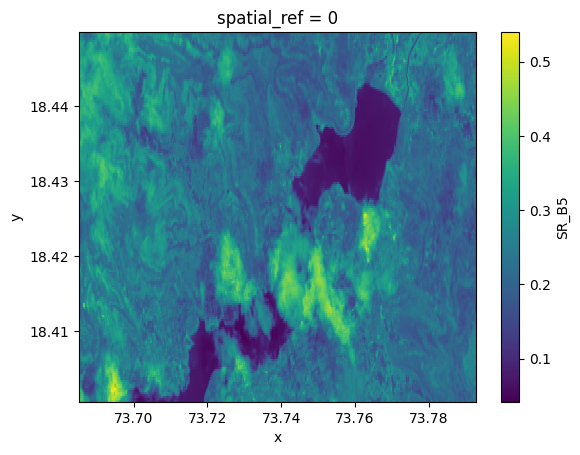

In [121]:
ds_landsat_.SR_B5.plot()

In [122]:
df_ndwi_test = ds_ndwi_.to_dataframe().reset_index()['NDWI_']

In [123]:
df_test = pd.concat([df_sentinel_test, df_landsat_test, df_ndwi_test], axis=1)
df_test

,B1,B2,B3,B4,B5,B6,B7,B8,B8A,B9,...,y,x,SR_B1,SR_B2,SR_B3,SR_B4,SR_B5,SR_B6,SR_B7,NDWI_
0,0.03100,0.03835,0.06635,0.06340,0.11705,0.20925,0.23260,0.23940,0.25635,0.25820,...,18.449734,73.685344,0.135706,0.144039,0.179555,0.183226,0.333871,0.283354,0.206024,0.0
1,0.02950,0.05340,0.08440,0.08970,0.13820,0.20745,0.22935,0.24370,0.25350,0.26890,...,18.449465,73.685344,0.127841,0.136875,0.177946,0.181824,0.323916,0.287987,0.212335,0.0
2,0.02950,0.04885,0.07710,0.08575,0.13180,0.20600,0.22505,0.22605,0.24510,0.26890,...,18.449195,73.685344,0.131375,0.140656,0.180861,0.186320,0.325140,0.292030,0.215333,0.0
3,0.02220,0.02520,0.06095,0.04080,0.11455,0.28075,0.31425,0.32395,0.33910,0.31885,...,18.448926,73.685344,0.132929,0.138209,0.180586,0.180779,0.350014,0.282323,0.201074,0.0
4,0.02220,0.02240,0.06015,0.03445,0.10930,0.28480,0.33800,0.34855,0.36100,0.31885,...,18.448656,73.685344,0.141412,0.147298,0.189125,0.184092,0.382656,0.275365,0.191229,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
73012,0.03745,0.04760,0.08030,0.08640,0.14160,0.21155,0.23830,0.24810,0.26375,0.26200,...,18.401764,73.792603,0.038466,0.049040,0.081462,0.085684,0.237333,0.212335,0.134593,0.0
73013,0.03745,0.05715,0.08425,0.09755,0.14300,0.20225,0.22840,0.22940,0.25405,0.26200,...,18.401495,73.792603,0.038920,0.051199,0.081847,0.086110,0.234005,0.217436,0.138690,0.0
73014,0.04020,0.05495,0.08660,0.09740,0.15195,0.21460,0.24055,0.24835,0.26410,0.27880,...,18.401225,73.792603,0.038439,0.050016,0.082191,0.084474,0.239161,0.209118,0.131306,0.0
73015,0.04020,0.04650,0.07775,0.07990,0.14000,0.23245,0.25700,0.25935,0.28265,0.27880,...,18.400956,73.792603,0.034891,0.045341,0.078437,0.078204,0.238309,0.198283,0.121791,0.0


In [124]:
df_test_ = df_test.dropna().copy()
df_test_

,B1,B2,B3,B4,B5,B6,B7,B8,B8A,B9,...,y,x,SR_B1,SR_B2,SR_B3,SR_B4,SR_B5,SR_B6,SR_B7,NDWI_
0,0.03100,0.03835,0.06635,0.06340,0.11705,0.20925,0.23260,0.23940,0.25635,0.25820,...,18.449734,73.685344,0.135706,0.144039,0.179555,0.183226,0.333871,0.283354,0.206024,0.0
1,0.02950,0.05340,0.08440,0.08970,0.13820,0.20745,0.22935,0.24370,0.25350,0.26890,...,18.449465,73.685344,0.127841,0.136875,0.177946,0.181824,0.323916,0.287987,0.212335,0.0
2,0.02950,0.04885,0.07710,0.08575,0.13180,0.20600,0.22505,0.22605,0.24510,0.26890,...,18.449195,73.685344,0.131375,0.140656,0.180861,0.186320,0.325140,0.292030,0.215333,0.0
3,0.02220,0.02520,0.06095,0.04080,0.11455,0.28075,0.31425,0.32395,0.33910,0.31885,...,18.448926,73.685344,0.132929,0.138209,0.180586,0.180779,0.350014,0.282323,0.201074,0.0
4,0.02220,0.02240,0.06015,0.03445,0.10930,0.28480,0.33800,0.34855,0.36100,0.31885,...,18.448656,73.685344,0.141412,0.147298,0.189125,0.184092,0.382656,0.275365,0.191229,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
73012,0.03745,0.04760,0.08030,0.08640,0.14160,0.21155,0.23830,0.24810,0.26375,0.26200,...,18.401764,73.792603,0.038466,0.049040,0.081462,0.085684,0.237333,0.212335,0.134593,0.0
73013,0.03745,0.05715,0.08425,0.09755,0.14300,0.20225,0.22840,0.22940,0.25405,0.26200,...,18.401495,73.792603,0.038920,0.051199,0.081847,0.086110,0.234005,0.217436,0.138690,0.0
73014,0.04020,0.05495,0.08660,0.09740,0.15195,0.21460,0.24055,0.24835,0.26410,0.27880,...,18.401225,73.792603,0.038439,0.050016,0.082191,0.084474,0.239161,0.209118,0.131306,0.0
73015,0.04020,0.04650,0.07775,0.07990,0.14000,0.23245,0.25700,0.25935,0.28265,0.27880,...,18.400956,73.792603,0.034891,0.045341,0.078437,0.078204,0.238309,0.198283,0.121791,0.0


In [125]:
df_test__ = df_test_[df_test_['NDWI_']==1.0]
df_test__.drop(columns='NDWI_', inplace=True)

In [126]:
df_test__

,B1,B2,B3,B4,B5,B6,B7,B8,B8A,B9,...,B12,y,x,SR_B1,SR_B2,SR_B3,SR_B4,SR_B5,SR_B6,SR_B7
7319,0.02625,0.04690,0.07670,0.08460,0.12300,0.16945,0.19320,0.19165,0.20170,0.12875,...,0.11275,18.400686,73.695855,0.290421,0.308709,0.313508,0.324040,0.417994,0.327697,0.253709
7501,0.03040,0.04145,0.08335,0.06865,0.12965,0.22625,0.24955,0.25000,0.25775,0.21645,...,0.12150,18.400956,73.696124,0.308489,0.322074,0.335315,0.343991,0.439279,0.351925,0.269645
7502,0.02625,0.03305,0.05455,0.06025,0.08045,0.08040,0.08470,0.08200,0.08500,0.12875,...,0.06370,18.400686,73.696124,0.283546,0.303277,0.300748,0.314786,0.372399,0.287245,0.225769
7683,0.02380,0.03530,0.05890,0.06025,0.08275,0.09385,0.11310,0.09375,0.12340,0.12165,...,0.07530,18.401225,73.696394,0.300528,0.315625,0.329677,0.338422,0.421376,0.351884,0.275214
7684,0.02380,0.03310,0.05565,0.05615,0.06855,0.05835,0.06140,0.05975,0.06240,0.12165,...,0.05215,18.400956,73.696394,0.289734,0.305423,0.315487,0.323971,0.374269,0.304708,0.236865
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
62587,0.01880,0.02570,0.04465,0.03180,0.04785,0.07530,0.09200,0.07070,0.09095,0.27090,...,0.07320,18.449465,73.777511,0.030271,0.045946,0.079579,0.075261,0.191009,0.123840,0.083718
62588,0.01880,0.01330,0.05075,0.02785,0.10335,0.29495,0.34860,0.34385,0.36580,0.27090,...,0.09930,18.449195,73.777511,0.021746,0.037669,0.069087,0.060906,0.264159,0.139790,0.074450
62769,0.01540,0.02500,0.04525,0.03170,0.05285,0.06785,0.07440,0.06470,0.08960,0.26110,...,0.06620,18.449734,73.777781,0.034919,0.049494,0.080445,0.076072,0.175347,0.131183,0.085821
62770,0.02225,0.01175,0.03885,0.03105,0.06950,0.20120,0.24825,0.27330,0.26365,0.31460,...,0.07645,18.449465,73.777781,0.027714,0.041766,0.073061,0.065389,0.245775,0.131856,0.074244


In [127]:
columns = [col for col in df_test__.columns.to_list() if col not in ['y','x']]
X_test = df_test__[columns]
X_test = qt.transform(X_test.values)

In [128]:
y_test_pred = model.predict(X_test)

In [129]:
print(y_test_pred, y_test_pred.shape)

[3.3038983 3.3038983 2.279377  ... 2.3217096 2.3217096 2.3217096] (9543,)


In [130]:
df_test__['y_test_pred'] = y_test_pred

In [131]:
columns = ['y', 'x', 'y_test_pred']
df_test__[columns]

,y,x,y_test_pred
7319,18.400686,73.695855,3.303898
7501,18.400956,73.696124,3.303898
7502,18.400686,73.696124,2.279377
7683,18.401225,73.696394,2.279377
7684,18.400956,73.696394,2.279377
...,...,...,...
62587,18.449465,73.777511,2.321710
62588,18.449195,73.777511,2.321710
62769,18.449734,73.777781,2.321710
62770,18.449465,73.777781,2.321710


In [134]:
# df_test__['y_test_pred_'] = df_test__['y_test_pred'].clip(lower=0, upper=12)

import plotly.express as px
# df = px.data.carshare()
fig = px.scatter_mapbox(df_test__, lat="y", lon="x", color="y_test_pred",
                  color_continuous_scale=px.colors.sequential.PuBu, size_max=5, zoom=11,
                  mapbox_style="carto-positron")
pio.write_image(fig, 'figure_prediction.png', scale=5)
fig.show()

In [135]:
import plotly.express as px
# df = px.data.carshare()
fig = px.scatter_mapbox(df_survey, lat="lat", lon="lon", color="bathy",
                  color_continuous_scale=px.colors.sequential.PuBu, size_max=5, zoom=11,
                  mapbox_style="carto-positron")
pio.write_image(fig, 'figure.png', scale=5)
fig.show()

In [136]:
!mv figure_prediction.png figure.png drive/MyDrive/Bathy/Survey_Data/Khadakwasala

In [137]:
# import plotly.express as px
# # df = px.data.carshare()
# fig = px.scatter_mapbox(df, lat="lat", lon="lon", color="bathy",
#                   color_continuous_scale=px.colors.cyclical.IceFire, size_max=5, zoom=12,
#                   mapbox_style="carto-positron")
# fig.show()

In [138]:
df_test__[columns].to_csv('khadakwasla_full_bathy_predicted.csv')

In [139]:
!mv khadakwasla_full_bathy_predicted.csv drive/MyDrive/Bathy/Survey_Data/Khadakwasala